# AILAB final notebook GROUP 2

Matteo Nulli, Lorenzo Tarricone, Yaraslau Ivashynka, Karim Ahmed Abdel Sadek, Fabio Pernisi, Joel Kim

#Heuristic and setting of our experiment

**Why cancer and genome?**

Studying the correlation between cancer and human genome is a difficult thing because the gene expression of cancer cells has an high variability among people and among the cells of the single person. Moreover, there can be many mutations developing over the time. If we want to understand and cure cancer cells it is crucial to study interactions between them and their neighbors (to see how cancer cells are escaping the T-cells, for example). Because of that we can't limit ourselfs to the study of the DNA, but we need to study the RNA since it is the "instruction list" that guides the cell behaviour/methabolism.

**Why is it important to study hypoxia?**

Cancer cells are excessively grown up cells that refuse to die committing a "controlled suicide" (*apoptosis*) and instead continue to grow in your body. To do that they'll need more oxigen than the normal cells and in the regions with large metastasis the blood vassels will not be able to keep up whith the cancer cells request of oxigen. The result is that cancer cells, about to die "against their will", will end up expressing abnormal genes (to encode a metabolic reaction to survive these extreme coditions) that eventually will lead them to become much more aggressive and difficult to treat.
Our question now is: can we identify apoxic cells? If we could understand how they react we could better treat cancer!

**How is the experiment designed?**

In our experiemnt we grow some cells in two different environments, one whith normal levels of oxigen (21%) and others with reduced levels of oxigen (1%) of oxigen. We then sequenced every single cell (Single-Cell RNA sequencing using the Smart-Seq and the Drop-Seq methods). Our target is starting from data to build a good predictor that given the gene expression of a celll will tell if this last was living in an hypoxic or normal environment. Both these two sequecing techniques were applied to two different cell lines, called HCC1086 and MCF7. The first one is a type of liver cancer and the second one is breast cancer.

**How are the data structured?**

The data provided to us were given in the format of .csv table. Every column represents a single cell sequenced (so an observetion), identified with a precise name containig informations about which of the two treatment conditions it grew up in (hypoxia or normoxia) and in case of Smarseq also its position on the plate of colture. Every row represents a single gene (so a feature), identified with its official gene symbol. Each entry of the table represents the gene expression count in case of SmartSeq sequenced cells and the Unique Molecular Identifier count (UMI) in case of DropSeq sequenced cells.

**How will we proceed with these data?**
We will analyse all the four tables given to us using a pretty standard Differential Gene Expression study pipeline that will include the following:

- Exploratory data analysis and Data cleaning
- Quality Control and Nomralization
- Feature selection and Higly Variable Genes study
- Dimensionality Reduction and Clustering
- Supervised learning: Tree based methods and Deep Neural Networks
- BONUS: Heuristics on Enrichment Analysis and Ontology Analysis

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Python libraries

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline

## Defining functions

In [ ]:
def get_condition_list(X, condition):
  names = X.columns.values
  l_condition = []
  for i in range(len(names)):
      if condition in names[i]:
          l_condition.append(i)
      else:
          continue
  return l_condition

In [ ]:
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    #if clusterer == GaussianMixture:
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

In [ ]:
from matplotlib.colors import LogNorm

def plot_gaussian_mixture(clusterer, X, resolution=1000, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z,
                 norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12))
    plt.contour(xx, yy, Z,
                norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12),
                linewidths=1, colors='k')

    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contour(xx, yy, Z,
                linewidths=2, colors='r', linestyles='dashed')

    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("$x_1$", fontsize=14)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

In [ ]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

# **DropSeq**

## MCF7

##Exploratory data analysis


This datased was already provided "clean", filtered and normalized, therefore we will just limit ourself to explore it and try to see the differences with the Datasets explored in the previous part. The differences will come from the different sequencing technique and, as just stated, from the fact that the data are already processed

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import random

In [ ]:
unfilt = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt", sep = " ")

We display the actual table

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
print("The dimension of this dataset is:", unfilt.shape,"\n")
unfilt

The dimension of this dataset is: (3000, 250) 



,output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam,output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam,output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
CYP1B1,343,131,452,27,5817,3841,9263,21543,1013,53,...,7890,4512,160,351,327,196,504,34565,20024,5953
CYP1B1-AS1,140,59,203,7,2669,1565,3866,9113,459,22,...,3647,2035,75,138,130,102,238,13717,7835,2367
CYP1A1,0,0,0,0,0,79,238,443,0,0,...,86,1654,0,0,0,1,0,11274,563,522
NDRG1,0,1,0,0,654,1263,2634,540,0,13,...,481,1052,0,0,54,243,62,1263,925,1572
DDIT4,386,289,0,288,2484,2596,1323,2044,36,204,...,3692,2410,800,1,189,266,417,4256,12733,2275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GRIK5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SLC25A27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DENND5A,51,34,0,4,60,107,74,127,0,66,...,179,97,0,35,56,45,0,140,7,37
CDK5R1,0,0,0,0,0,0,0,0,0,8,...,0,0,26,0,0,19,0,0,0,0


We can first check if the data type is always the same across the features in the dataframe

In [ ]:
assert [unfilt.T.dtypes[i] == 'int64' for i in range(len(unfilt.T.dtypes))]
#And this is the case

First of all we want to see if there'are some missing value in the dataset. This is a standard operation that we want to do on a dataset, because if there are some missing entries we will have to deal with them somehow

In [ ]:
unfilt.isnull().sum(axis = 1).sum(axis = 0)
#Luckly enough there are not :)

0

Another standard procedure is the one to look for duplicate values among the features in our table. As pointed out in the suggestion notebook this could be due to many reasons: redundancy in gene annotation, overlapping of gene annotation on the same region, etc...

In [ ]:
dup_rows_unfilt = unfilt[unfilt.duplicated(keep=False)]
print("The number of duplicate rows is", dup_rows_unfilt.shape[0])

The number of duplicate rows is 2


Here the number of duplicate raws is zero as expected, the data were previously cleaned

---
Now we turn our attention to the study of the correlation between cells. In principle, given the fact that every gene expression in the table is coming from the same cell line we expect overall an high correlation among them.

In [ ]:
plt.figure(figsize=(12,10))

corr = unfilt.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()

sns.heatmap(corr,cmap="mako", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

We can see from the plot above that the correlation structure is much more homogeneus now, if compared to the unfiltered data.

We now want to analyse the structure among the covariates. Notice that here due to computational power issues we display the correlation just of the first 10% of the genes.

Average correlation between cells:  0.1409328696690194
Minimum correlation between cells:  -0.7181342606619613 



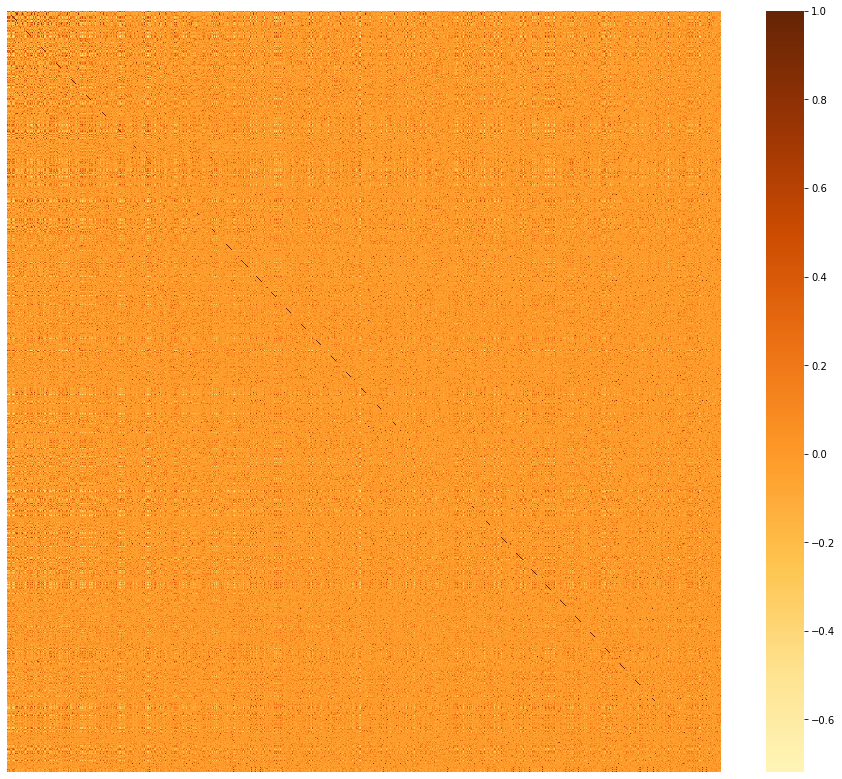

In [ ]:
plt.figure(figsize=(16,14))
#df_small = df.iloc[:, :50]
#c= df_small.corr()
corr = unfilt.iloc[:3000,:].T.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(corr,cmap="YlOrBr", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

But again we can clearly see how there's not a well defined structure among the genes.


---

Given what we've seen in the table `unfilt` we suspect that our dataset will be probably very sparsed, so we want to quantify that sparsity in some way. The first and more intutive one is to calculate the average sparsity and to plot the table in some way



In [ ]:
#Avarage density of zeros in the data

print(f"The average sparsity of the table is: {(unfilt == 0).sum().sum() / (unfilt.shape[0] * unfilt.shape[1]) * 100}%")

The average sparsity of the table is: 63.62213333333333%


This is a pretty high value! our dataset is definitely sparsed.

In the following plot we color with blue the points in the table that are different from zero. This can give us an idea of how this high sparsity is distributed across the dataset

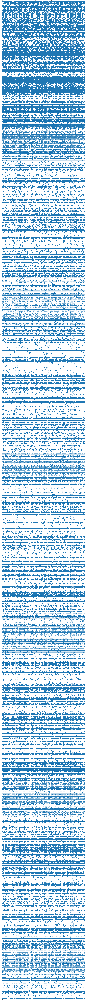

In [ ]:
plt.figure(figsize=(25, 600))
plt.spy(unfilt.iloc[:, :], markersize=5)

If we compare this graph to the ones obtained on the unfiltered data, we see how we cannot find entire white vertical lines, this is becasue pronblematic cells have been filtered out.

Again, we can see much more homogeneity in the sparsity

The great limitation of this plot is that we don't have a differentiation among values of the expression (but we will have a more complete picture with an heatmap leater), to have an idea of that we use the function `describe()` on our dataset and we plot an histogram of the expression for some randomly choosen cells

In [ ]:
unfilt.describe()

,output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam,output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam,output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,74.140333,90.907000,99.089000,88.137000,110.395667,148.849000,126.422667,142.229667,91.781000,91.426333,...,144.008333,133.846000,98.699333,84.070333,101.416333,96.636667,92.344333,154.387333,125.340000,132.017667
std,345.005307,409.560228,442.980702,425.804372,822.178446,1710.088769,1351.567001,1515.496440,388.660906,376.793214,...,1349.125183,1242.320764,417.410827,406.100983,513.988262,499.224863,680.698856,1169.686762,1066.926126,1422.143351
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,24.000000,37.000000,33.000000,34.000000,38.250000,24.000000,13.000000,22.000000,37.000000,44.000000,...,33.000000,38.000000,52.250000,25.000000,33.000000,44.000000,17.000000,19.000000,21.000000,20.250000
max,8222.000000,10167.000000,11446.000000,10312.000000,30586.000000,65037.000000,52680.000000,60789.000000,9394.000000,9077.000000,...,56392.000000,50404.000000,11352.000000,8713.000000,17006.000000,16625.000000,29663.000000,34565.000000,34175.000000,57814.000000


Text(0, 0.5, 'Frequency')

<Figure size 1440x1224 with 0 Axes>

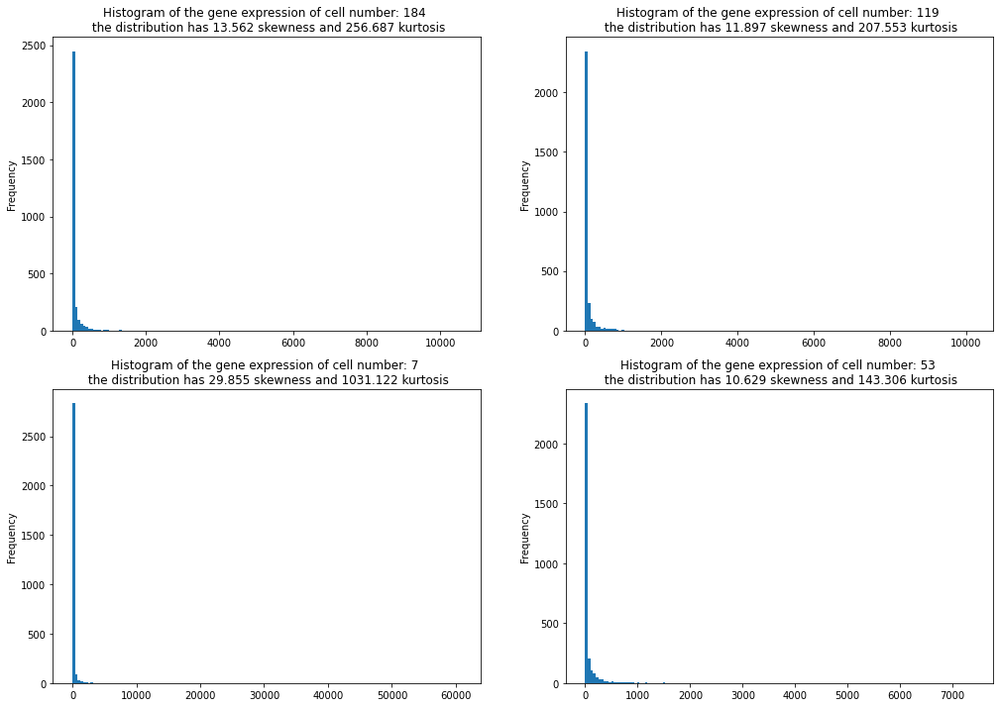

In [ ]:
from scipy.stats import kurtosis, skew

plt.figure(figsize=(20, 17))

first_cell = random.randrange(unfilt.shape[1])
second_cell = random.randrange(unfilt.shape[1])
third_cell = random.randrange(unfilt.shape[1])
fourth_cell = random.randrange(unfilt.shape[1])

plt.figure(figsize=(17, 12))

plt.subplot(2, 2, 1)
plt.hist(unfilt.iloc[:,first_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {first_cell} \n the distribution has {round(skew(unfilt.iloc[:,first_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,first_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 2)
plt.hist(unfilt.iloc[:,second_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {second_cell} \n the distribution has {round(skew(unfilt.iloc[:,second_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,second_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 3)
plt.hist(unfilt.iloc[:,third_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {third_cell} \n the distribution has {round(skew(unfilt.iloc[:,third_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,third_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 4)
plt.hist(unfilt.iloc[:,fourth_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {fourth_cell} \n the distribution has {round(skew(unfilt.iloc[:,fourth_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,fourth_cell]), 3)} kurtosis")
plt.ylabel("Frequency")



The result is showing is that even if the data are filtered and normalized, the distribution of counts among the cells is the same.

---

Now that we assessed that there are a lot of zeros in our dataset, we want to see for some genes how is the distributions on non-zero values, to compare it to the one we had in the case of unfiltered and unnormalized data.

Text(0, 0.5, 'Frequency (possibly scaled)')

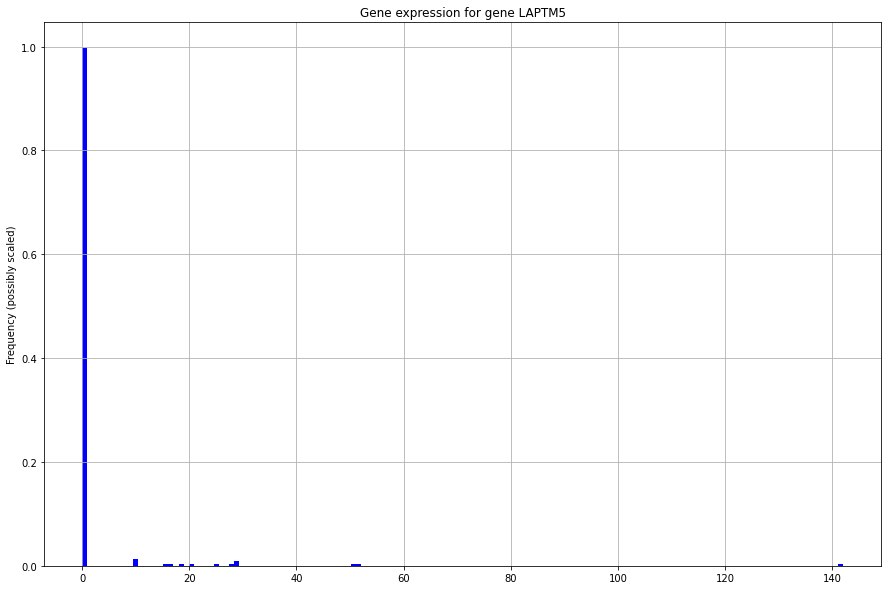

In [ ]:
rdn_gene = random.randrange(unfilt.shape[0])

plt.figure(figsize=(15, 10))
unfilt.iloc[rdn_gene, :].plot.hist(grid=True,
                                      density = True,
                                      bins=150,
                                      color='blue')

plt.title(f"Gene expression for gene {unfilt.index[rdn_gene]}")
plt.ylabel("Frequency (possibly scaled)")

But we see that the distribution is similar to the one in the unfiltered case

The distribution seems therefore to follow a Poisson/Negative binomial distribution.

---
Given what stated above, we further investigate the ralation between mean and variance of the gene expression among cells to see if we would prefer adopting a Negative Binomial ditribution:

Text(0, 0.5, 'Variance')

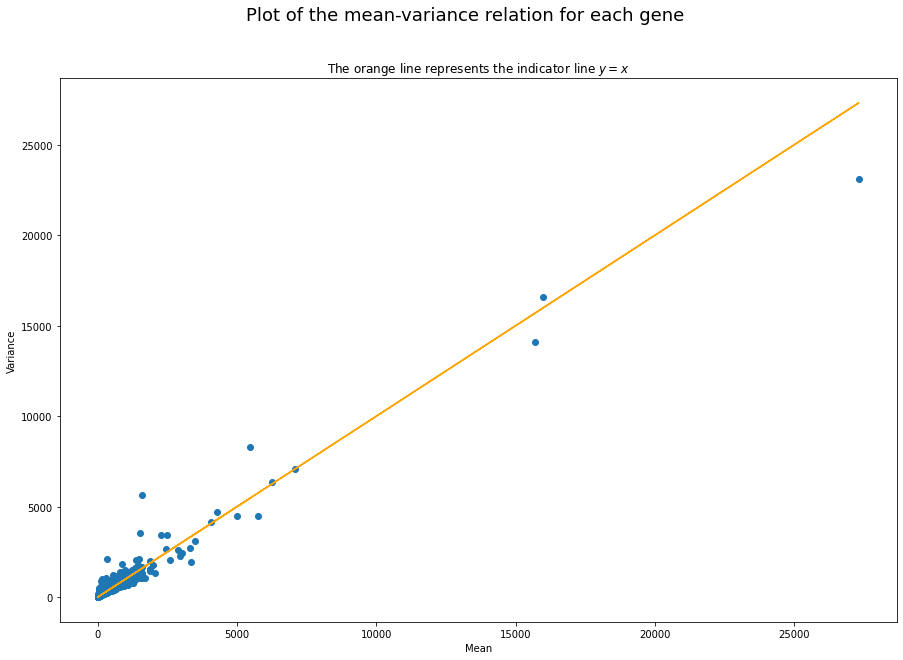

In [ ]:
##################### THIS PLOT COULD TAKE SOME TIME ########################
mean_vector = unfilt.T.describe().iloc[1,:]
var_vector = unfilt.T.describe().iloc[2,:]

plt.figure(figsize=(15, 10))
plt.scatter(mean_vector, var_vector)
plt.plot(mean_vector, mean_vector, color = "orange")
plt.title("The orange line represents the indicator line $y=x$", fontsize = 12)
plt.suptitle("Plot of the mean-variance relation for each gene", fontsize = 18)
plt.xlabel("Mean")
plt.ylabel("Variance")



Here we observe that the mean-variace relation is mantained! The filtering just eliminated some outlier cells!

Loading the filtered and normalised datafile for MCF7-DropSeq

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)
print("data frame dimensions :", np.shape(df))
df.head()

In [ ]:
# t_meta = meta.T
# print(t_meta.shape)
# hypo_ind = (meta["Condition"] == "Hypo")
# hypo_ind = hypo_ind.to_numpy()
# norm_ind = (~(hypo_ind))
# norm_ind.sum()
# hypo_ind

### Dimensionality Reduction

> Throughout this section, we will be applying a Principal Components Analysis for the purpose of analyzing data and dimensionality reduction, as well as other dimensionality reduction techniques and discuss their outcomes.

We start by converting our Pandas DataFrame into a NumPy array.

In [ ]:
data = df.to_numpy()

Then, we extract the indices of hypoxic and normoxic cells and build two lists out of them

In [ ]:
l_hypoxia = get_condition_list(df, "Hypo")
l_normoxia = get_condition_list(df, "Norm")
print(len(l_normoxia))
l_hypoxia[:10], l_normoxia[:10]

12705


([12705, 12706, 12707, 12708, 12709, 12710, 12711, 12712, 12713, 12714],
 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

#### PCA

As we import the PCA function from the SKLearn library, we proceed to apply it to our dataset, requesting a 95% variance expression on the reduced outcome.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components = 0.95)
data_red = pca.fit_transform(data.T)
pca.n_components_

761

As we might have expected from the increased size of the dataset, we now need 761 principal components in order to express 95% of the variance.


In [ ]:
data_red.shape

(21626, 761)

In [ ]:
pca.explained_variance_ratio_[:3]

array([0.24948472, 0.0862724 , 0.0443336 ])

We now plot the results, starting from a 2D scatter plot on the two main principal components.

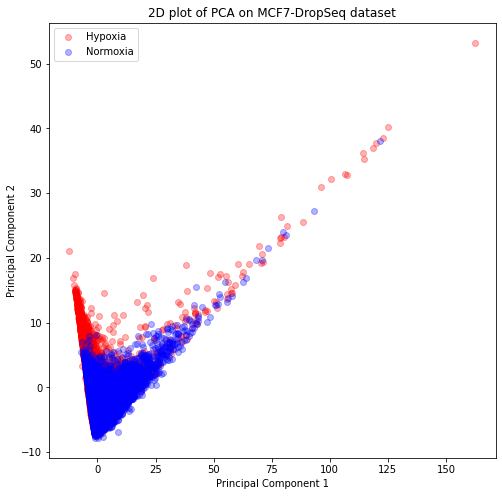

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('2D plot of PCA on MCF7-DropSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()
plt.show()

Next, we can again build a scatter plot, 3D this time, as we take into account the third principal component as well.

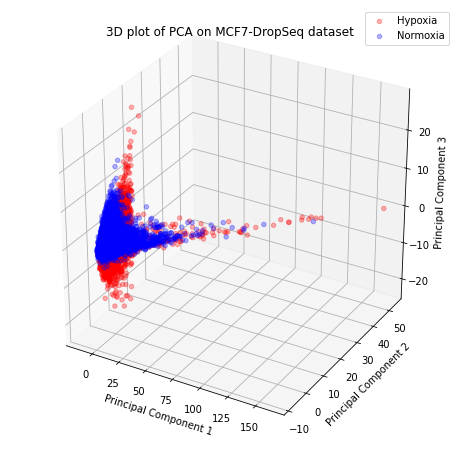

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D plot of PCA on MCF7-DropSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], data_red[l_hypoxia,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], data_red[l_normoxia,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

##### Interactive 3D version
> Might take a few minutes to run

Notice. The following implementation is quite time-consuming when executed on large-sized datasets (since a simpler static version of the 3D plot has been implemented above, we provide the code cell below commented).

In [ ]:
plot_df = pd.DataFrame(data_red[:, 0:3])
plot_df.columns = ["PC1","PC2","PC3"]

aux_lst = []
for name in df.columns.values:
  if 'Hypo' in name:
    aux_lst.append(1)
  elif 'Norm' in name:
    aux_lst.append(0)

plot_df["Color"] = aux_lst
plot_df

,x,y,z,Color
0,-26874.672396,766.013957,-880.248212,0
1,-26354.743000,5039.849020,-5372.826809,0
2,-29351.253485,2414.726753,-3076.254097,0
3,-24813.833293,-75.979072,-3934.877133,0
4,4454.732179,-1836.273354,-1595.912696,1
...,...,...,...,...
245,-18394.340467,-5274.416642,649.525614,0
246,-10023.164045,-14507.616731,-1941.969647,0
247,603.697715,11492.308191,43230.690452,1
248,17016.931253,8398.335833,4439.884803,1


In [ ]:
# !pip install jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

fig = px.scatter_3d(
    data_frame = plot_df,
    x = "PC1",
    y = "PC2",
    z = "PC3",
    color = "Color",
    title = "Interactive PCA plot with supervised labels",
)

# build jupyter dash app
app = JupyterDash(__name__)
# add html components and figure to app
app.layout = html.Div([dcc.Graph(figure=fig)])
# run app inline
app.run_server(mode='inline')

<IPython.core.display.Javascript object>

#### t-SNE


We first import TSNE from the SKLearn library

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

Now, PCA is carried out on the dataframe, and all the data is mapped into a 50-dimensional space.
PCA is performed as a sort of pre-processing stage because t-SNE does not work properly on datasets having too many features (in this case the initial dataset have 3000 features), so we need to reduce the dimensionality to about 50 (a number of features with which t-SNE produces good results).

In [ ]:
pca50 = PCA(n_components=50)
data_fifty = pca50.fit_transform(data.T)
data_fifty.shape

(21626, 50)

In [ ]:
pca50.explained_variance_ratio_[0:4]

array([0.24948472, 0.0862724 , 0.0443336 , 0.02627554])

We now apply t-SNE on the output of PCA (i.e. the data_fifty reduced dataset).

In [ ]:
# This takes a long time (more than 7 minutes on Colab)
embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(data_fifty)

In [ ]:
embedded.shape

(21626, 2)

We now plot the results.

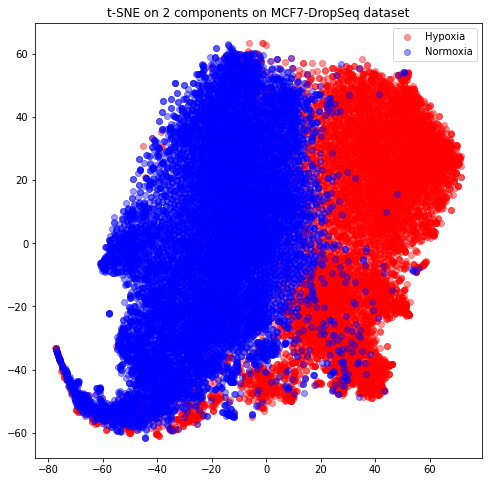

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedded[l_hypoxia,0], embedded[l_hypoxia,1], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedded[l_normoxia,0], embedded[l_normoxia,1], c="b",alpha = 0.4, label="Normoxia")
ax.set_title('t-SNE on 2 components on MCF7-DropSeq dataset')
ax.legend()

plt.show()

We now visualize how the t-SNE plot changes as we introduce ‘pca’ as init. Given both previous cases, we would expect to get a very close plot to the one described by the PCA function.

In [ ]:
Also this take a long time
embedded2 = TSNE(n_components=2, learning_rate='auto', init='pca').fit_transform(data_fifty)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.set_title('2 component t-SNE on MCF7-DropSeq dataset (pca as init)', fontsize = 15)

ax.scatter(embedded2[l_hypoxia,0], embedded2[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(embedded2[l_normoxia,0], embedded2[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

In opposition to our assumption, the outcome seems to be very different from the visualization of the actual PCA. To understand why this happened, we need to go back to the criteria we chose for the implementation of t-SNE. As a matter of fact, we have been using 50-component PCA reductions to fit the model: this amount of principal components is more than sufficient to express 95% of the variance in both SmartSeq datasets - which explains the nearly perfect match with the actual PCA -; on the dataset considered, however, fifty components are a significantly low number of directions compared to the 761 selected for the 95% variance expression, thus, the high graphical divergence between the two plots.

#### UMAP

Let's first install the umap library

In [ ]:
# !pip install umap-learn

     |████████████████████████████████| 88 kB 3.0 MB/s 
     |████████████████████████████████| 1.1 MB 40.7 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=ce75bd95b80eaa7196e8381fc04923b2f808201bc2b92e7c2a20cc713b4ff08c
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=f7e687ffcf649d46a44e5827938b3ddca0a60de035d4c051298bef1995aec004
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


In [ ]:
from umap import UMAP

In [ ]:
reducer = UMAP()

embedding_data = reducer.fit_transform(data.T)
embedding_data.shape

(21626, 2)

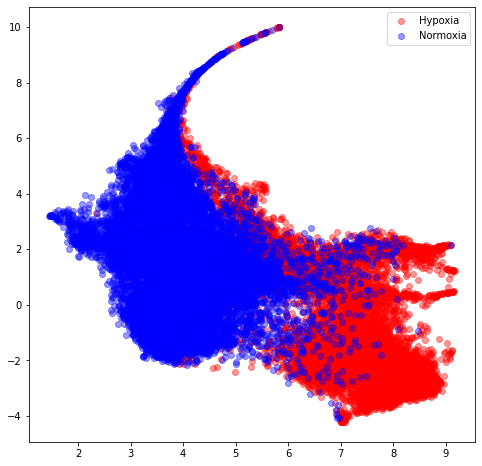

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedding_data[l_hypoxia, 1], embedding_data[l_hypoxia,0], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedding_data[l_normoxia, 1], embedding_data[l_normoxia,0], c="b",alpha = 0.4, label="Normoxia")
ax.legend()
plt.show()

### Clustering methods on Reduced dataset
> For a matter of computational convenience, we consider the reduced dataset expressing 95% of the variance.

As we may have noticed in the dimensionality reduction section above, the plot visualizing the PCA method shows that the data has a less clear as in the lower-size datasets, while t-SNE still gives us a reasonably clearer visualization. Thus, we will use this latter visualization to plot the comparisons.

#### K-means

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=42)
pred_clus = kmeans.fit_predict(data_red)

In [ ]:
hypo = (pred_clus == 1)
norm = (pred_clus == 0)

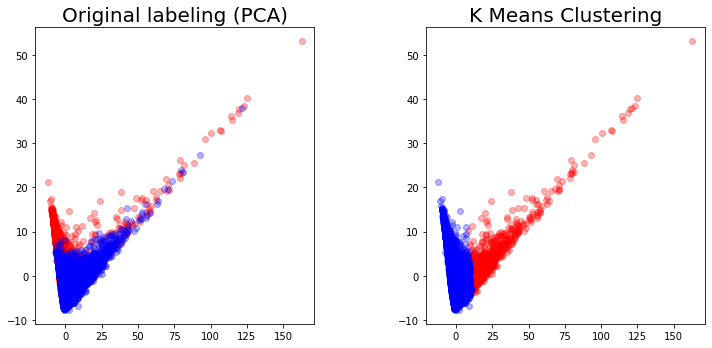

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

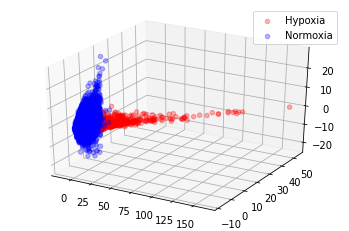

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo,0],data_red[hypo,1], data_red[hypo,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm,0],data_red[norm,1], data_red[norm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

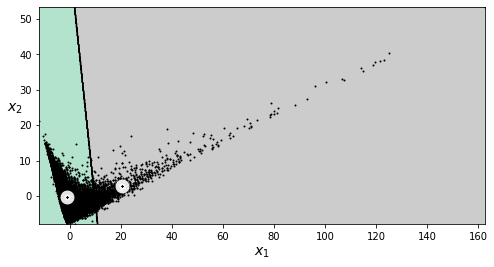

In [ ]:
kmeans.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, data_red[:, 0:2])
plt.show()

By observing the plots, we can notice that K-Means clustering in actually quite far from the original labeling.

#### Gaussian mixture

In [ ]:
from sklearn.mixture import GaussianMixture

gm = GaussianMixture(n_components=2, random_state=42,
                     covariance_type = "diag")

In [ ]:
pred_mix = gm.fit_predict(data_red)

In [ ]:
hypo_mix = (pred_mix == 1)
norm_mix = (pred_mix == 0)

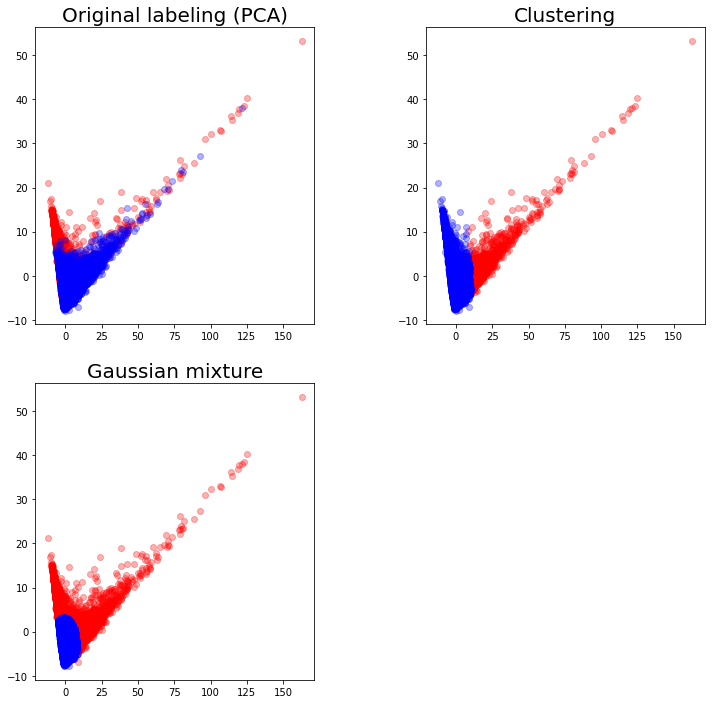

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

ax2.scatter(embedded[hypo_mix,0],embedded[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(embedded[norm_mix,0],embedded[norm_mix,1], c="b",alpha = 0.3)


plt.subplots_adjust(wspace=0.4)

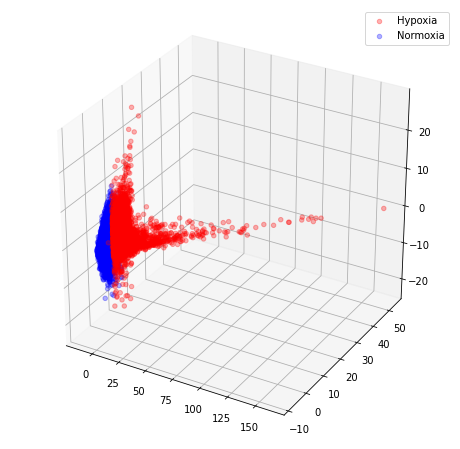

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], data_red[hypo_mix,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_mix,0],data_red[norm_mix,1], data_red[norm_mix,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

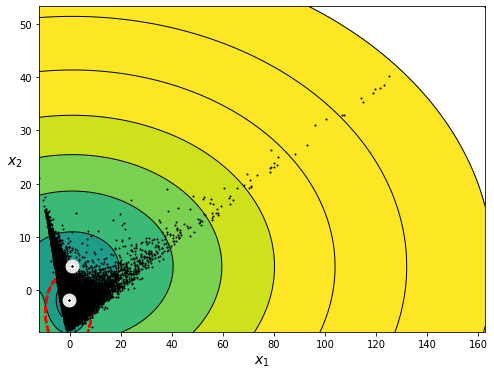

In [ ]:
gm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(gm, data_red[:, 0:2])
plt.show()

With Gaussian mixture plots do not seem to get better to the original labeling. However, nothing can be said for sure as two and three-dimensional plots gives us a very narrow view of the dataset space.

#### Bayesian Gaussian Mixture


Here we try to implement a different yet similar method to Gaussian Mixture.

The Bayesian Gaussian Mixture is a method which allows you to not know the exact number of clusters in your data, in a sense it is better because by using a prior it understands how many clusters there should be.

In [ ]:
from sklearn.mixture import BayesianGaussianMixture

In [ ]:
bgm = BayesianGaussianMixture(n_components = 2, random_state = 42)
pred_bgm = bgm.fit_predict(data_red)

In [ ]:
hypo_bgm = (pred_bgm == 1)
norm_bgm = (pred_bgm == 0)

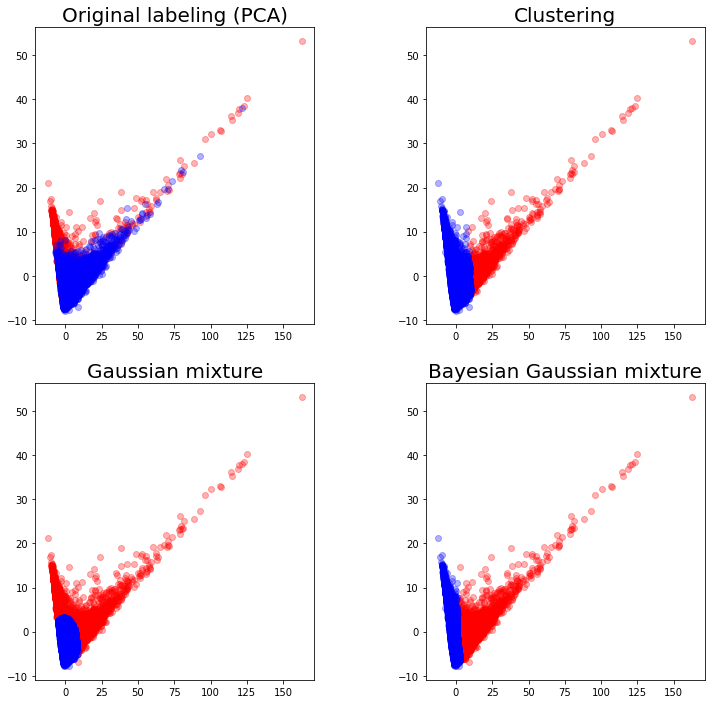

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax3 = fig.add_subplot(2,2,4)

ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

ax2.scatter(embedded[hypo_mix,0],embedded[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(embedded[norm_mix,0],embedded[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(embedded[hypo_bgm,0],embedded[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(embedded[norm_bgm,0],embedded[norm_bgm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

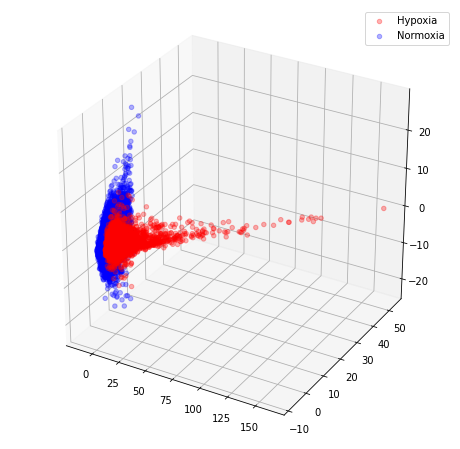

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], data_red[hypo_bgm,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], data_red[norm_bgm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

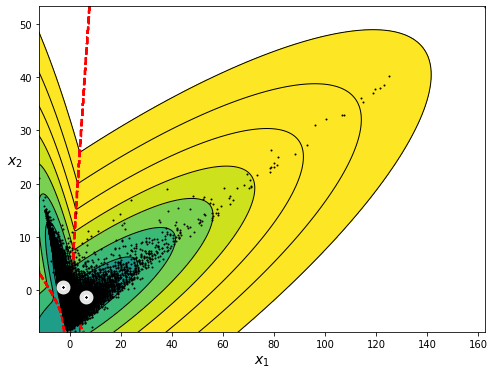

In [ ]:
bgm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(bgm, data_red[:, 0:2])
plt.show()

Again, the plots above show a very different outcome from the expected one. Nonetheless, we will now o see

#### Agglomerative Clustering

We are also interested on the behavior and performance of hierarchical clustering methods.
In agglomerative algorithms, each item starts in its own cluster, then, objects are recursively clustered by similarity, i.e. the distances between groups, two items at a time. Eventually, all items will be grouped in one cluster.
We choose to implement Agglomerative Clustering, as it is the most commonly used technique of this kind.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
aggl = AgglomerativeClustering(n_clusters=2, linkage='ward')

In [ ]:
pred_aggl = aggl.fit_predict(data_red)

In [ ]:
hypo_aggl = (pred_aggl == 1)
norm_aggl = (pred_aggl == 0)

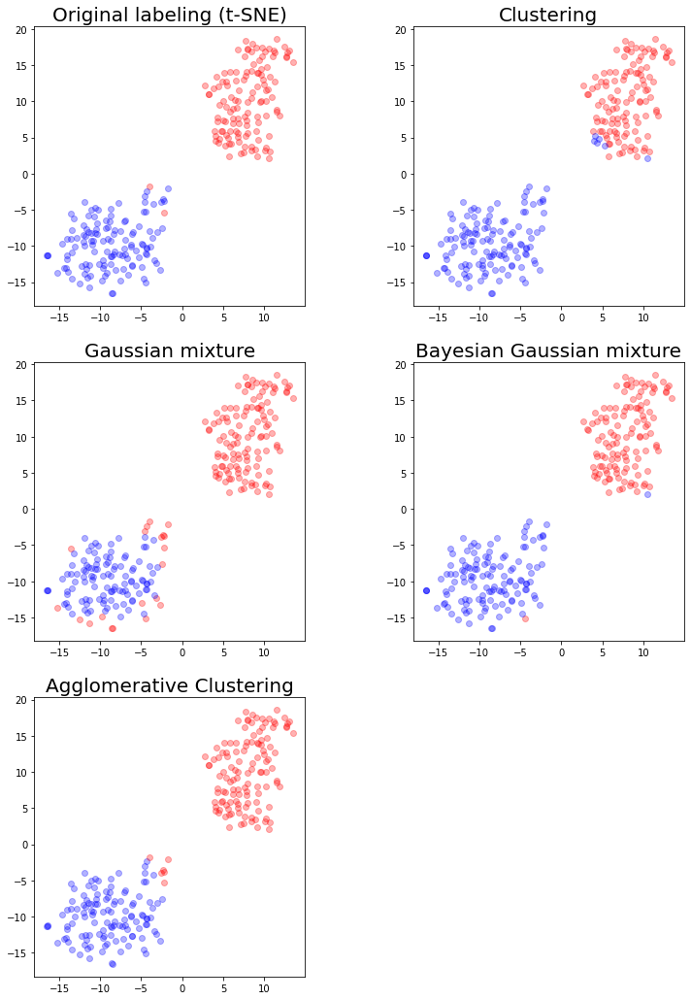

In [ ]:
fig = plt.figure(figsize = (12,18))
ax = fig.add_subplot(3,2,1)
ax1 = fig.add_subplot(3,2,2)
ax2 = fig.add_subplot(3,2,3)
ax3 = fig.add_subplot(3,2,4)
ax4 = fig.add_subplot(3,2,5)

ax.set_title('Original labeling (t-SNE)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax4.set_title('Agglomerative Clustering', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

ax2.scatter(embedded[hypo_mix,0],embedded[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(embedded[norm_mix,0],embedded[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(embedded[hypo_bgm,0],embedded[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(embedded[norm_bgm,0],embedded[norm_bgm,1], c="b",alpha = 0.3)

ax4.scatter(embedded[hypo_aggl,0],embedded[hypo_aggl,1], c="b",alpha = 0.3)
ax4.scatter(embedded[norm_aggl,0],embedded[norm_aggl,1], c="r",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

This clustering method can be easily visualized in 2D plots known as dendograms, in which the clusters at each step of the algorithm can be clearly displayed. With the following cell, we will try to implement dendograms for each linkage method available for AgglomerativeClustering.

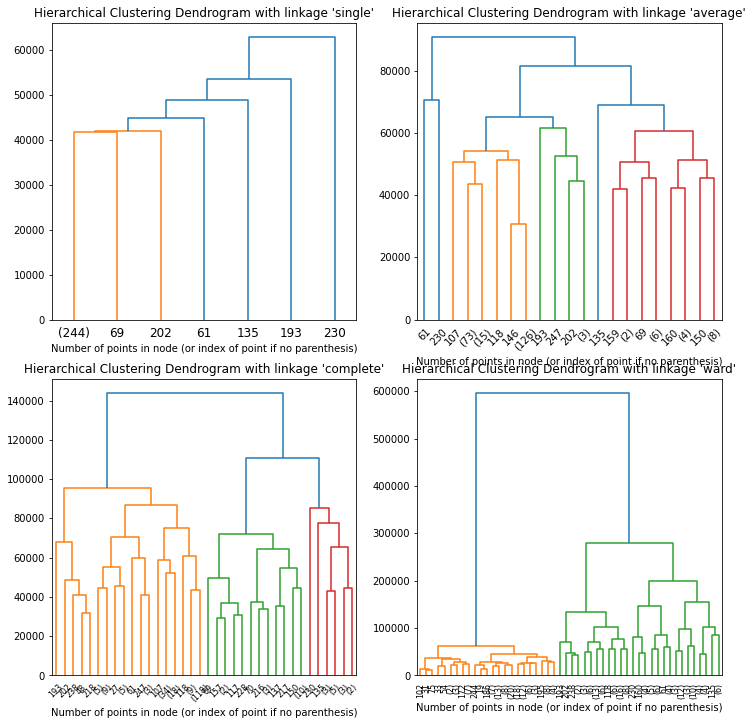

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
l_linkage = ['single', 'average', 'complete', 'ward']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12,12))

for n, linkage in enumerate(l_linkage):
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage=linkage)
    model = model.fit(data.T)

    ax = plt.subplot(2, 2, n + 1)
    # plot the top five levels of the dendrogram
    plot_dendrogram(model, truncate_mode="level", p=5)
    ax.set_title("Hierarchical Clustering Dendrogram with linkage " + "'" + linkage + "'")
    ax.set_xlabel("Number of points in node (or index of point if no parenthesis)")

plt.show()

#### Evaluating Clustering methods

We will now look at how the various clusterings perform in understanding whether a cell is an Hypoxia one or not.

We will do it over the normal data, i.e. 'df' transposed, that is data.T

In [ ]:
y = []
for i in range(len(l_hypoxia) + len(l_normoxia)):
  if i in l_hypoxia:
    y.append(1)
  elif i in l_normoxia:
    y.append(0)

##### K Means Clustering

In [ ]:
y_pred_clus = kmeans.fit_predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_clus==y))
print("fraction of correct predictions", np.sum(y_pred_clus==y) / len(y_pred_clus))

correct predictions:  9826
fraction of correct predictions 0.45436049200036993


##### Gaussian Mixture

In [ ]:
gm.fit(data.T)
y_pred_mix = gm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_mix==y))
print("fraction of correct predictions", np.sum(y_pred_mix==y) / len(y_pred_mix))

correct predictions:  241
fraction of correct predictions 0.964


##### Bayesian Gaussian Mixture

In [ ]:
bgm.fit(data.T)
y_pred_bgm = bgm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_bgm==y))
print("fraction of correct predictions", np.sum(y_pred_bgm==y) / len(y_pred_bgm))

correct predictions:  244
fraction of correct predictions 0.976


By observing these results, we can conclude that all clustering methods implemented above, be them Kmeans, GM, or BGM, perform rather poorly on this larger dataset.

###Classifiers

#### Preprocessing: PCA reduction for hyperparameters tuning

The Classifiers section for DropSeq datasets is carried out in a very similar fashion to the Classifiers for SmartSeq datasets.
However, we now need to take into account the significantly larger dimensionality of the datasets. Applying the same methods we used for SmartSeq would result in unsustainable running times (especially for grid search).
For this reason, we will run grid search (and obtain the best hyperparameters) on a PCA-reduced dataset, where we will lower the number of features and therefore reduce the running time.
After obtaining the best-performing hyperparameters, we will implement the models on the original dataset, using exactly those parameters.


In [ ]:
from sklearn.decomposition import PCA

#MC_drop_T stands for MCF7 DropSeq, transposed
MC_drop_T = df.T
X = MC_drop_T.to_numpy()
pca = PCA(n_components=0.6) # We accept a low explained variance, since the Random Forest and Gradient Bossting classifiers
# are very time-consuming
X_red = pca.fit_transform(X)

In [ ]:
X_red.shape

(21626, 34)

In [ ]:
sum(pca.explained_variance_ratio_)

0.6030874057396105

We now add the "Condition" column with 0,1 labels for Normoxic and Hypoxic cells.

In [ ]:
from sklearn.model_selection import train_test_split

condition = []
for i in list(MC_drop_T.index):
  if "Normoxia" in i:
    condition.append(0)
  if "Hypoxia" in i:
    condition.append(1)
MC_drop_T["Condition"] = condition

y = np.array(condition)

X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(X_red, y, test_size=0.33, random_state = 42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = 42)

In [ ]:
(X_train_red.shape, X_test_red.shape, X_train.shape, X_test.shape, )

((14489, 34), (7137, 34), (14489, 3000), (7137, 3000))

#### Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(criterion = "gini", random_state=42)

p_grid = {'n_estimators': [800, 1200]}

gs = GridSearchCV(rfc, param_grid = p_grid).fit(X_train_red, y_train_red)
gs.best_params_

In [ ]:
from  sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rfc = RandomForestClassifier(n_estimators = gs.best_params_['n_estimators'],
                             min_samples_leaf = 1,
                             min_samples_split = 2,
                             criterion="gini", random_state = 42)

rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)
accuracy_score(y_pred, y_test)

##### Analysing relationship between Principal Components and accuracy

We will now move to the analysis of how the accuracy of our Random Forest changes as we consider more and more principal components of our data.

In [ ]:
df_train_MC7 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt", sep = " ")

In [ ]:
namesM = df_train_MC7.columns.values
df_train_MC7_t = df_train_MC7.T
df_train_MC7_t["Classification"] = [i for i in range(len(namesM))]


for i in range(len(namesM)):
    if "Hypo" in namesM[i]:
        df_train_MC7_t["Classification"][i] = 1
    else:
        df_train_MC7_t["Classification"][i] = 0

l = list(df_train_MC7_t["Classification"])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score

acc_list = []
dim_list = [i for i in range(1, 20)]
for i in range(1, 20):

  #PCA
  X = df_train_MC7.to_numpy()
  X_t = np.transpose(X)
  pca = PCA(n_components = i)
  Xred = pca.fit_transform(X_t)
  df_red = pd.DataFrame(Xred)

  #Creating the classification framework
  df_red["Classification"] = l


  X = df_red.iloc[:,:-1]
  y = df_red["Classification"]


  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = 42)

  #Fitting the random forest
  rfc = RandomForestClassifier(n_estimators = 200,
                               min_samples_leaf = 1,
                               min_samples_split = 2,
                               criterion="gini", random_state = 42)

  rfc.fit(X_train, y_train)
  y_pred = rfc.predict(X_test)
  acc_list.append(accuracy_score(y_pred, y_test))

<BarContainer object of 19 artists>

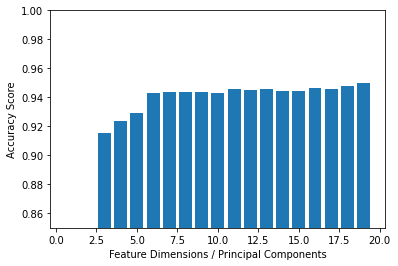

In [ ]:
#plotting the accuracy scores
plt.figure(figsize = (30,15))
plt.xlabel("Feature Dimensions / Principal Components", )
plt.ylabel("Accuracy Score")
plt.ylim([0.85, 1])

plt.bar(dim_list, acc_list)

#### Gradient Boosting

In [ ]:
(X_train_red.shape, X_test_red.shape, X_train.shape, X_test.shape)

((14489, 34), (7137, 34), (14489, 3000), (7137, 3000))

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(random_state = 42)

p_grid = {'max_features' : [10, 20],
          'max_leaf_nodes' : [16],
          'n_estimators' : [400]}

gs = GridSearchCV(gb_clf, param_grid = p_grid).fit(X_train_red, y_train_red)
gs.best_params_

{'max_features': 10, 'max_leaf_nodes': 16, 'n_estimators': 400}

In [ ]:
gb_clf = GradientBoostingClassifier(learning_rate = 0.1,
                                    max_features = gs.best_params_['max_features'],
                                    max_leaf_nodes = gs.best_params_['max_leaf_nodes'],
                                    n_estimators = gs.best_params_['n_estimators'])

gb_clf.fit(X_train, y_train)
y_pred = gb_clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.9722572509457755

#### SVM

In [ ]:
(X_train_red.shape, X_test_red.shape, X_train.shape, X_test.shape)

((14489, 34), (7137, 34), (14489, 3000), (7137, 3000))

In [ ]:
from sklearn.svm import SVC

svc = SVC()
parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}

clf = GridSearchCV(svc, parameters).fit(X_train_red, y_train_red)
print(clf.best_params_)
clf.best_params

In [ ]:
svc = SVC(C=clf.best_params_["C"],
          kernel=clf.best_params_["kernel"])

svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
accuracy_score(y_pred, y_test)

0.9812246041754239

#### Neural Network

In [ ]:
df_train_MC7 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_Filtered_Normalised_3000_Data_train.txt", sep = " ")

In [ ]:
namesM = df_train_MC7.columns.values

Distinguish Hypoxia and Normoxia Cells

In [ ]:
df_train_MC7_t = df_train_MC7.T
df_train_MC7_t["Classification"] = [i for i in range(len(namesM))]

for i in range(len(namesM)):
    if "Hypo" in namesM[i]:
        df_train_MC7_t["Classification"][i] = 1
    else:
        df_train_MC7_t["Classification"][i] = 0

Now divide dataset

In [ ]:
from sklearn.model_selection import train_test_split

X = df_train_MC7_t.iloc[:,:-1]
y = df_train_MC7_t["Classification"]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.23, random_state = 42)

In [ ]:
x_valid, x_train = X_train[:1000], X_train[1000:]
y_valid, y_train = y_train[:1000], y_train[1000:]

In [ ]:
model = Sequential()
model.add(Dense(units=512, activation= "relu", input_shape= (3000,)))
model.add(Dense(units= 256, activation= "relu"))
model.add(Dense(units= 256, activation= "relu"))
model.add(Dense(units= 64, activation= "relu"))
model.add(Dense(1, activation= 'sigmoid'))

model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=keras.optimizers.SGD(learning_rate=0.01, momentum=0.2),
              metrics=['accuracy'])



In [ ]:
model.fit(x_train, y_train, epochs = 20, validation_data = (x_valid, y_valid))

Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


488/490 [============================>.] - ETA: 0s - loss: 0.2045 - accuracy: 0.9346

/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


490/490 [==============================] - 14s 27ms/step - loss: 0.2043 - accuracy: 0.9346 - val_loss: 0.0968 - val_accuracy: 0.9710
Epoch 2/20
490/490 [==============================] - 8s 16ms/step - loss: 0.0648 - accuracy: 0.9792 - val_loss: 0.0761 - val_accuracy: 0.9700
Epoch 3/20
490/490 [==============================] - 7s 15ms/step - loss: 0.0511 - accuracy: 0.9836 - val_loss: 0.0878 - val_accuracy: 0.9660
Epoch 4/20
490/490 [==============================] - 8s 15ms/step - loss: 0.0403 - accuracy: 0.9875 - val_loss: 0.0713 - val_accuracy: 0.9760
Epoch 5/20
490/490 [==============================] - 8s 15ms/step - loss: 0.0328 - accuracy: 0.9899 - val_loss: 0.0893 - val_accuracy: 0.9640
Epoch 6/20
490/490 [==============================] - 7s 15ms/step - loss: 0.0283 - accuracy: 0.9909 - val_loss: 0.0739 - val_accuracy: 0.9780
Epoch 7/20
490/490 [==============================] - 8s 15ms/step - loss: 0.0228 - accuracy: 0.9930 - val_loss: 0.0819 - val_accuracy: 0.9730
Epoch 8/2

In [ ]:
model.evaluate(X_test, y_test)

156/156 [==============================] - 1s 7ms/step - loss: 0.0892 - accuracy: 0.9783


[0.08923697471618652, 0.9782871007919312]

Saving figure keras_learning_curves_plot


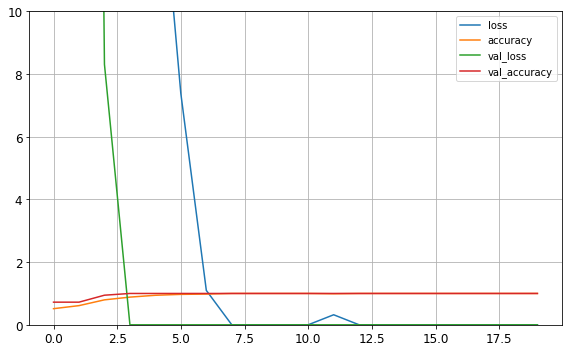

In [ ]:
import pandas as pd

pd.DataFrame(hist.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 10)
save_fig("keras_learning_curves_plot")
plt.show()

also the plot here exactly shows what we were expecting

## HCC1806

##Exploratory data analysis


This datased was already provided "clean", filtered and normalized, therefore we will just limit ourself to explore it and try to see the differences with the Datasets explored in the previous part. The differences will come from the different sequencing technique and, as just stated, from the fact that the data are already processed

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import random

In [ ]:
unfilt = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_Filtered_Normalised_3000_Data_train.txt", sep = " ")

We display the actual table

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
print("The dimension of this dataset is:", unfilt.shape,"\n")
unfilt

The dimension of this dataset is: (3000, 250) 



,output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam,output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam,output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
CYP1B1,343,131,452,27,5817,3841,9263,21543,1013,53,...,7890,4512,160,351,327,196,504,34565,20024,5953
CYP1B1-AS1,140,59,203,7,2669,1565,3866,9113,459,22,...,3647,2035,75,138,130,102,238,13717,7835,2367
CYP1A1,0,0,0,0,0,79,238,443,0,0,...,86,1654,0,0,0,1,0,11274,563,522
NDRG1,0,1,0,0,654,1263,2634,540,0,13,...,481,1052,0,0,54,243,62,1263,925,1572
DDIT4,386,289,0,288,2484,2596,1323,2044,36,204,...,3692,2410,800,1,189,266,417,4256,12733,2275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GRIK5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SLC25A27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DENND5A,51,34,0,4,60,107,74,127,0,66,...,179,97,0,35,56,45,0,140,7,37
CDK5R1,0,0,0,0,0,0,0,0,0,8,...,0,0,26,0,0,19,0,0,0,0


We can first check if the data type is always the same across the features in the dataframe

In [ ]:
assert [unfilt.T.dtypes[i] == 'int64' for i in range(len(unfilt.T.dtypes))]
#And this is the case

First of all we want to see if there'are some missing value in the dataset. This is a standard operation that we want to do on a dataset, because if there are some missing entries we will have to deal with them somehow

In [ ]:
unfilt.isnull().sum(axis = 1).sum(axis = 0)
#Luckly enough there are not :)

0

Another standard procedure is the one to look for duplicate values among the features in our table. As pointed out in the suggestion notebook this could be due to many reasons: redundancy in gene annotation, overlapping of gene annotation on the same region, etc...

In [ ]:
dup_rows_unfilt = unfilt[unfilt.duplicated(keep=False)]
print("The number of duplicate rows is", dup_rows_unfilt.shape[0])

The number of duplicate rows is 2


Here the number of duplicate raws is zero as expected, the data were previously cleaned

---
Now we turn our attention to the study of the correlation between cells. In principle, given the fact that every gene expression in the table is coming from the same cell line we expect overall an high correlation among them.

In [ ]:
plt.figure(figsize=(12,10))

corr = unfilt.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()

sns.heatmap(corr,cmap="mako", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

We can see from the plot above that the correlation structure is much more homogeneus now, if compared to the unfiltered data.

We now want to analyse the structure among the covariates. Notice that here due to computational power issues we display the correlation just of the first 10% of the genes.

Average correlation between cells:  0.1409328696690194
Minimum correlation between cells:  -0.7181342606619613 



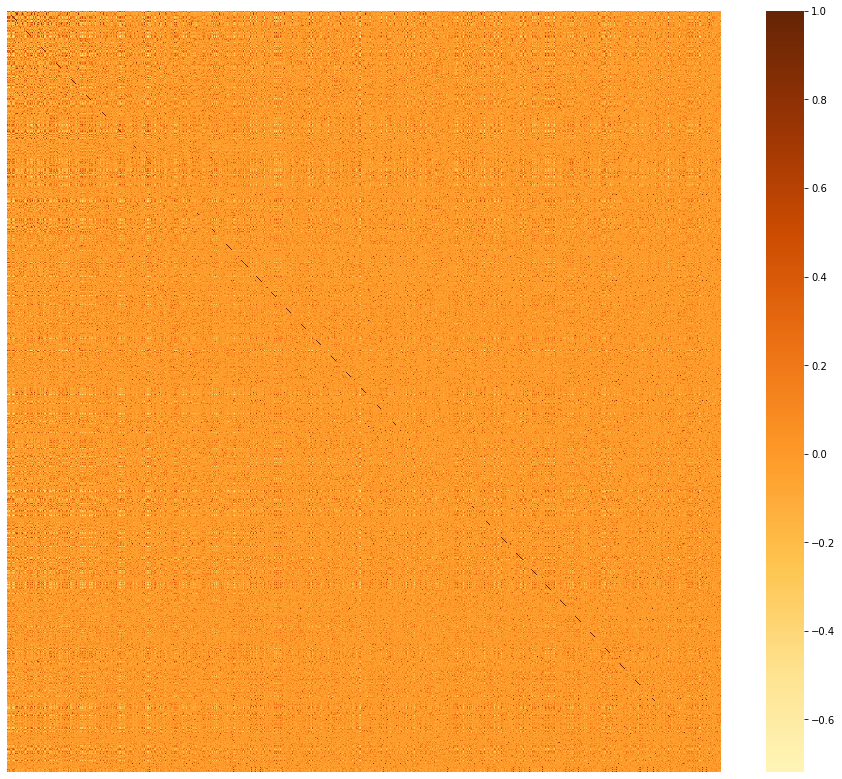

In [ ]:
plt.figure(figsize=(16,14))
#df_small = df.iloc[:, :50]
#c= df_small.corr()
corr = unfilt.iloc[:3000,:].T.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(corr,cmap="YlOrBr", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

But again we can clearly see how there's not a well defined structure among the genes.


---

Given what we've seen in the table `unfilt` we suspect that our dataset will be probably very sparsed, so we want to quantify that sparsity in some way. The first and more intutive one is to calculate the average sparsity and to plot the table in some way



In [ ]:
#Avarage density of zeros in the data

print(f"The average sparsity of the table is: {(unfilt == 0).sum().sum() / (unfilt.shape[0] * unfilt.shape[1]) * 100}%")

The average sparsity of the table is: 63.62213333333333%


This is a pretty high value! our dataset is definitely sparsed.

In the following plot we color with blue the points in the table that are different from zero. This can give us an idea of how this high sparsity is distributed across the dataset

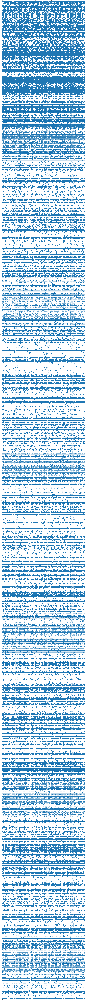

In [ ]:
plt.figure(figsize=(25, 600))
plt.spy(unfilt.iloc[:, :], markersize=5)

If we compare this graph to the ones obtained on the unfiltered data, we see how we cannot find entire white vertical lines, this is becasue pronblematic cells have been filtered out.

Again, we can see much more homogeneity in the sparsity

The great limitation of this plot is that we don't have a differentiation among values of the expression (but we will have a more complete picture with an heatmap leater), to have an idea of that we use the function `describe()` on our dataset and we plot an histogram of the expression for some randomly choosen cells

In [ ]:
unfilt.describe()

,output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam,output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam,output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,74.140333,90.907000,99.089000,88.137000,110.395667,148.849000,126.422667,142.229667,91.781000,91.426333,...,144.008333,133.846000,98.699333,84.070333,101.416333,96.636667,92.344333,154.387333,125.340000,132.017667
std,345.005307,409.560228,442.980702,425.804372,822.178446,1710.088769,1351.567001,1515.496440,388.660906,376.793214,...,1349.125183,1242.320764,417.410827,406.100983,513.988262,499.224863,680.698856,1169.686762,1066.926126,1422.143351
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,24.000000,37.000000,33.000000,34.000000,38.250000,24.000000,13.000000,22.000000,37.000000,44.000000,...,33.000000,38.000000,52.250000,25.000000,33.000000,44.000000,17.000000,19.000000,21.000000,20.250000
max,8222.000000,10167.000000,11446.000000,10312.000000,30586.000000,65037.000000,52680.000000,60789.000000,9394.000000,9077.000000,...,56392.000000,50404.000000,11352.000000,8713.000000,17006.000000,16625.000000,29663.000000,34565.000000,34175.000000,57814.000000


Text(0, 0.5, 'Frequency')

<Figure size 1440x1224 with 0 Axes>

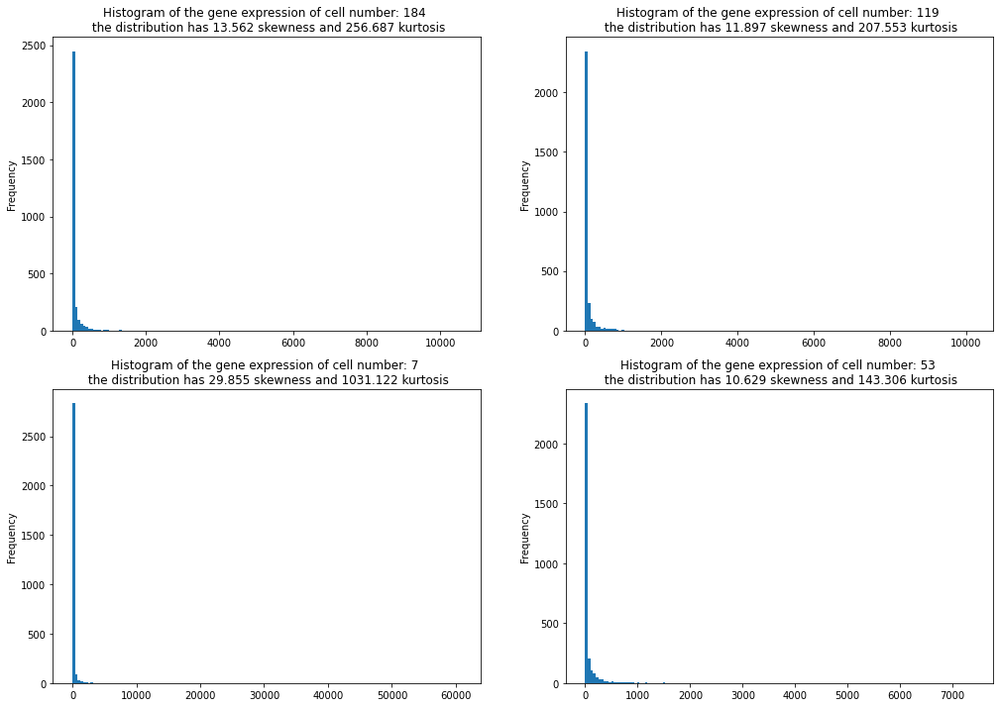

In [ ]:
from scipy.stats import kurtosis, skew

plt.figure(figsize=(20, 17))

first_cell = random.randrange(unfilt.shape[1])
second_cell = random.randrange(unfilt.shape[1])
third_cell = random.randrange(unfilt.shape[1])
fourth_cell = random.randrange(unfilt.shape[1])

plt.figure(figsize=(17, 12))

plt.subplot(2, 2, 1)
plt.hist(unfilt.iloc[:,first_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {first_cell} \n the distribution has {round(skew(unfilt.iloc[:,first_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,first_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 2)
plt.hist(unfilt.iloc[:,second_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {second_cell} \n the distribution has {round(skew(unfilt.iloc[:,second_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,second_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 3)
plt.hist(unfilt.iloc[:,third_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {third_cell} \n the distribution has {round(skew(unfilt.iloc[:,third_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,third_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 4)
plt.hist(unfilt.iloc[:,fourth_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {fourth_cell} \n the distribution has {round(skew(unfilt.iloc[:,fourth_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,fourth_cell]), 3)} kurtosis")
plt.ylabel("Frequency")



The result is showing is that even if the data are filtered and normalized, the distribution of counts among the cells is the same.

---

Now that we assessed that there are a lot of zeros in our dataset, we want to see for some genes how is the distributions on non-zero values, to compare it to the one we had in the case of unfiltered and unnormalized data.

Text(0, 0.5, 'Frequency (possibly scaled)')

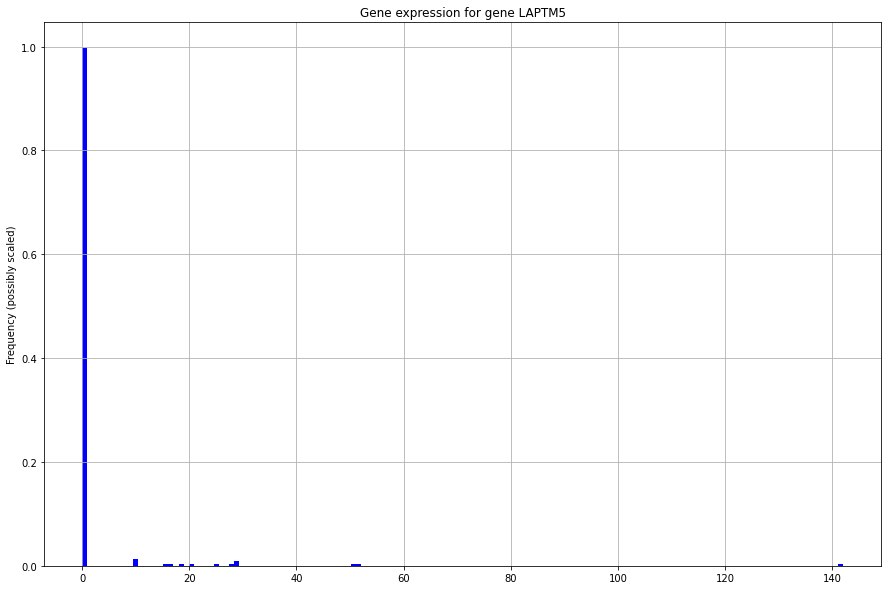

In [ ]:
rdn_gene = random.randrange(unfilt.shape[0])

plt.figure(figsize=(15, 10))
unfilt.iloc[rdn_gene, :].plot.hist(grid=True,
                                      density = True,
                                      bins=150,
                                      color='blue')

plt.title(f"Gene expression for gene {unfilt.index[rdn_gene]}")
plt.ylabel("Frequency (possibly scaled)")

But we see that the distribution is similar to the one in the unfiltered case

The distribution seems therefore to follow a Poisson/Negative binomial distribution.

---
Given what stated above, we further investigate the ralation between mean and variance of the gene expression among cells to see if we would prefer adopting a Negative Binomial ditribution:

Text(0, 0.5, 'Variance')

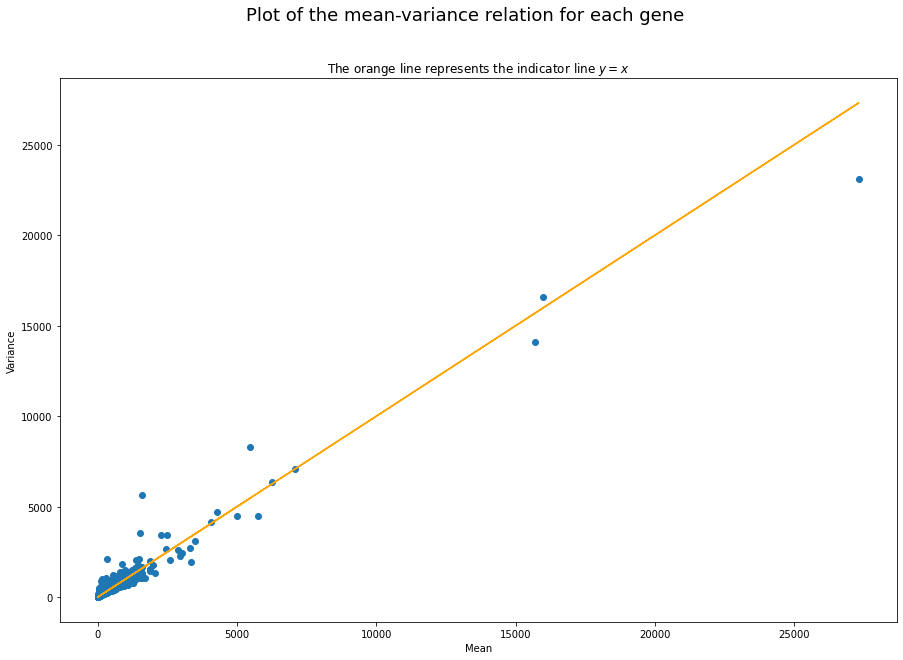

In [ ]:
##################### THIS PLOT COULD TAKE SOME TIME ########################
mean_vector = unfilt.T.describe().iloc[1,:]
var_vector = unfilt.T.describe().iloc[2,:]

plt.figure(figsize=(15, 10))
plt.scatter(mean_vector, var_vector)
plt.plot(mean_vector, mean_vector, color = "orange")
plt.title("The orange line represents the indicator line $y=x$", fontsize = 12)
plt.suptitle("Plot of the mean-variance relation for each gene", fontsize = 18)
plt.xlabel("Mean")
plt.ylabel("Variance")



Here we observe that the mean-variace relation is mantained! The filtering just eliminated some outlier cells!

Loading the meta data and the filtered and normalised dataset of HCC1806 SmartSeq.

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)
print("data frame dimensions :", np.shape(df))
df.head()

data frame dimensions : (3000, 14682)


,AAAAAACCCGGC_Normoxia,AAAACCGGATGC_Normoxia,AAAACGAGCTAG_Normoxia,AAAACTTCCCCG_Normoxia,AAAAGCCTACCC_Normoxia,AAACACAAATCT_Normoxia,AAACCAAGCCCA_Normoxia,AAACCATGCACT_Normoxia,AAACCTCCGGCT_Normoxia,AAACGCCGGTCC_Normoxia,...,TTTTCTGATGGT_Hypoxia,TTTTGATTCAGA_Hypoxia,TTTTGCAACTGA_Hypoxia,TTTTGCCGGGCC_Hypoxia,TTTTGTTAGCCT_Hypoxia,TTTTTACCAATC_Hypoxia,TTTTTCCGTGCA_Hypoxia,TTTTTGCCTGGG_Hypoxia,TTTTTGTAACAG_Hypoxia,TTTTTTTGAATC_Hypoxia
H1-5,2,2,5,1,0,0,0,0,1,0,...,0,1,0,2,1,0,0,0,3,1
MALAT1,3,3,2,3,12,3,1,2,0,0,...,3,1,1,1,4,0,4,1,3,6
MT-RNR2,0,0,0,0,0,0,0,0,0,1,...,1,2,2,2,0,0,1,0,1,0
ARVCF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCYRN1,0,1,1,0,0,1,1,2,0,3,...,1,1,0,1,1,0,0,1,0,0


In [ ]:
# t_meta = meta.T
# print(t_meta.shape)
# hypo_ind = (meta["Condition"] == "Hypo")
# hypo_ind = hypo_ind.to_numpy()
# norm_ind = (~(hypo_ind))
# norm_ind.sum()
# hypo_ind

### Dimensionality Reduction

> Throughout this section, we will be applying a Principal Components Analysis for the purpose of analyzing data and dimensionality reduction, as well as other dimensionality reduction techniques and discuss their outcomes.

We start by converting our Pandas DataFrame into a NumPy array.

In [ ]:
data = df.to_numpy()

Then, we extract the indices of hypoxic and normoxic cells and build two lists out of them

In [ ]:
l_hypoxia = get_condition_list(df, "Hypo")
l_normoxia = get_condition_list(df, "Norm")
print(len(l_normoxia))
l_hypoxia[:10], l_normoxia[:10]

5783


([5783, 5784, 5785, 5786, 5787, 5788, 5789, 5790, 5791, 5792],
 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

#### PCA

As we import the PCA function from the SKLearn library, we proceed to apply it to our dataset, requesting a 95% variance expression on the reduced outcome.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components = 0.95)
data_red = pca.fit_transform(data.T)
pca.n_components_

844

Again, as we might have expected, we observe that we need a high number of components in order to express 95% of the variance, that is 844 components.

In [ ]:
data_red.shape

(14682, 844)

In [ ]:
pca.explained_variance_ratio_[:3]

array([0.08423243, 0.06316067, 0.03883139])

We now plot the results, starting from a 2D scatter plot on the two main principal components.

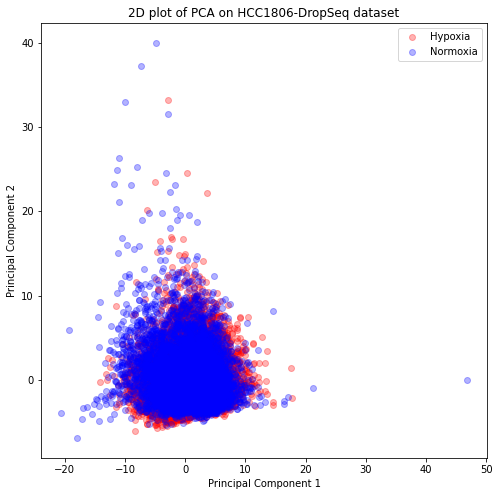

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('2D plot of PCA on HCC1806-DropSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()
plt.show()

Next, we can again build a scatter plot, 3D this time, as we take into account the third principal component as well.

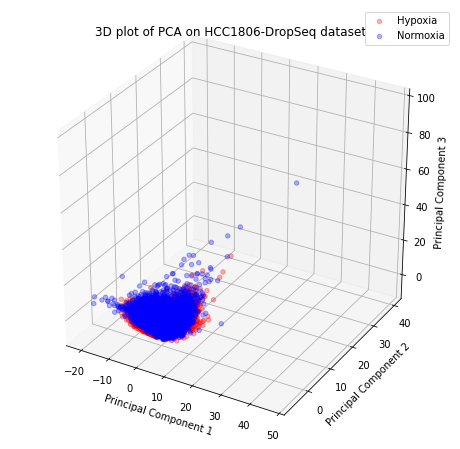

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D plot of PCA on HCC1806-DropSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], data_red[l_hypoxia,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], data_red[l_normoxia,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

##### Interactive 3D version
> Might take a few minutes to run

Notice. The following implementation is quite time-consuming when executed on large-sized datasets (since a simpler static version of the 3D plot has been implemented above, we provide the code cell below commented).

In [ ]:
plot_df = pd.DataFrame(data_red[:, 0:3])
plot_df.columns = ["PC1","PC2","PC3"]

aux_lst = []
for name in df.columns.values:
  if 'Hypo' in name:
    aux_lst.append(1)
  elif 'Norm' in name:
    aux_lst.append(0)

plot_df["Color"] = aux_lst
plot_df

,x,y,z,Color
0,-26874.672396,766.013957,-880.248212,0
1,-26354.743000,5039.849020,-5372.826809,0
2,-29351.253485,2414.726753,-3076.254097,0
3,-24813.833293,-75.979072,-3934.877133,0
4,4454.732179,-1836.273354,-1595.912696,1
...,...,...,...,...
245,-18394.340467,-5274.416642,649.525614,0
246,-10023.164045,-14507.616731,-1941.969647,0
247,603.697715,11492.308191,43230.690452,1
248,17016.931253,8398.335833,4439.884803,1


In [ ]:
# !pip install jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

fig = px.scatter_3d(
    data_frame = plot_df,
    x = "PC1",
    y = "PC2",
    z = "PC3",
    color = "Color",
    title = "Interactive PCA plot with supervised labels",
)

# build jupyter dash app
app = JupyterDash(__name__)
# add html components and figure to app
app.layout = html.Div([dcc.Graph(figure=fig)])
# run app inline
app.run_server(mode='inline')

<IPython.core.display.Javascript object>

#### t-SNE


We first import TSNE from the SKLearn library

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

Now, PCA is carried out on the dataframe, and all the data is mapped into a 50-dimensional space.
PCA is performed as a sort of pre-processing stage because t-SNE does not work properly on datasets having too many features (in this case the initial dataset have 3000 features), so we need to reduce the dimensionality to about 50 (a number of features with which t-SNE produces good results).

In [ ]:
pca50 = PCA(n_components=50)
data_fifty = pca50.fit_transform(data.T)
data_fifty.shape

(14682, 50)

In [ ]:
pca50.explained_variance_ratio_[0:4]

array([0.08423243, 0.06316067, 0.03883139, 0.02866254])

We now apply t-SNE on the output of PCA (i.e. the data_fifty reduced dataset).

In [ ]:
embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(data_fifty)

In [ ]:
embedded.shape

(14682, 2)

We now plot the results.

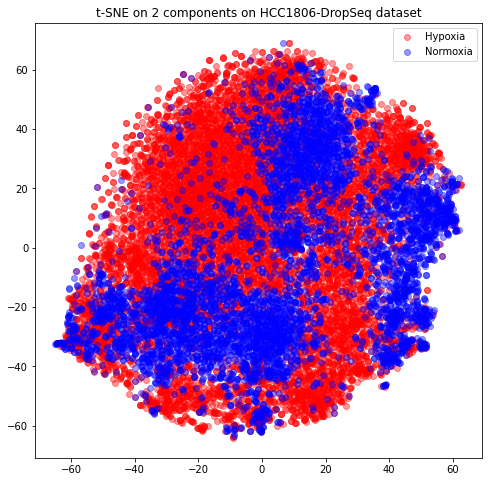

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedded[l_hypoxia,0], embedded[l_hypoxia,1], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedded[l_normoxia,0], embedded[l_normoxia,1], c="b",alpha = 0.4, label="Normoxia")
ax.set_title('t-SNE on 2 components on HCC1806-DropSeq dataset')
ax.legend()

plt.show()

Considering the outcome on the previous dataset, we can assume a similar result also this time. More specifically, the 50-component PCA is a even lower selection compared to the 95%-variance-expressing reduction considering 844 principal components.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


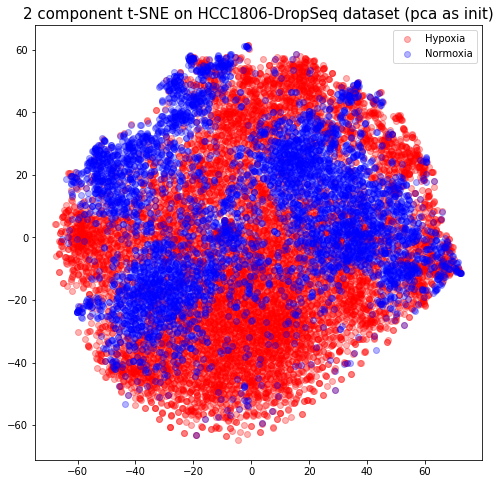

In [ ]:
# This also takes quite a long time to run
embedded2 = TSNE(n_components=2, learning_rate='auto', init='pca').fit_transform(data_fifty)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.set_title('2 component t-SNE on HCC1806-DropSeq dataset (pca as init)', fontsize = 15)

ax.scatter(embedded2[l_hypoxia,0], embedded2[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(embedded2[l_normoxia,0], embedded2[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

Indeed, the given output does not share any significant similarities with the plot of the PCA function.

#### UMAP

Let's first install the umap library

In [ ]:
# !pip install umap-learn

     |████████████████████████████████| 88 kB 3.0 MB/s 
     |████████████████████████████████| 1.1 MB 40.7 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=ce75bd95b80eaa7196e8381fc04923b2f808201bc2b92e7c2a20cc713b4ff08c
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=f7e687ffcf649d46a44e5827938b3ddca0a60de035d4c051298bef1995aec004
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


In [ ]:
from umap import UMAP

In [ ]:
reducer = UMAP()

embedding_data = reducer.fit_transform(data.T)
embedding_data.shape

(14682, 2)

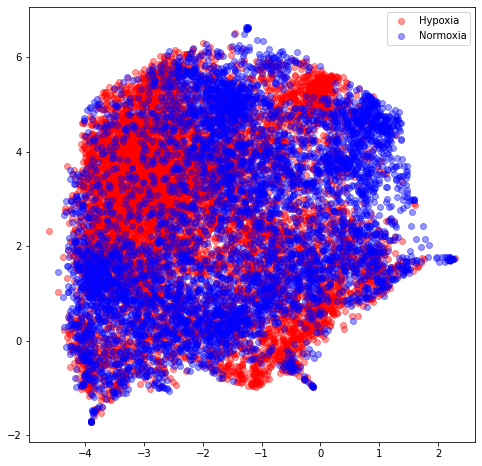

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedding_data[l_hypoxia, 1], embedding_data[l_hypoxia,0], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedding_data[l_normoxia, 1], embedding_data[l_normoxia,0], c="b",alpha = 0.4, label="Normoxia")
ax.legend()
plt.show()

### Clustering methods on Reduced dataset
> For a matter of computational convenience, we consider the reduced dataset expressing 95% of the variance.

As we may have noticed in the dimensionality reduction section above, the plot visualizing the PCA method shows that the data has a less clear as in the lower-size datasets, while t-SNE still gives us a reasonably clearer visualization. Thus, we will use this latter visualization to plot the comparisons.

#### K-means

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=42)
pred_clus = kmeans.fit_predict(data_red)

In [ ]:
hypo = (pred_clus == 1)
norm = (pred_clus == 0)

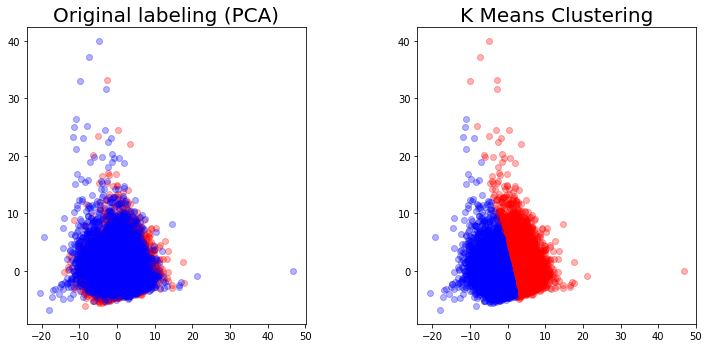

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

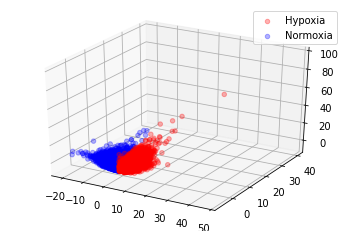

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo,0],data_red[hypo,1], data_red[hypo,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm,0],data_red[norm,1], data_red[norm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

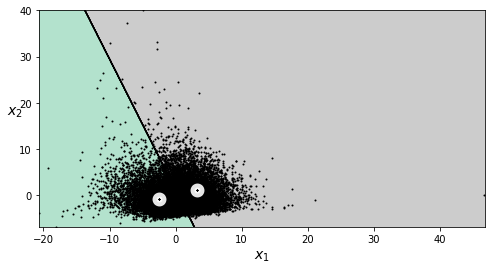

In [ ]:
kmeans.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, data_red[:, 0:2])
plt.show()

From the plots above, we deduce that also in the case of this large-sized dataset K-means clustering might not produce accurate predictions.

#### Gaussian mixture

In [ ]:
from sklearn.mixture import GaussianMixture

gm = GaussianMixture(n_components=2, random_state=42,
                     covariance_type = "diag")

In [ ]:
pred_mix = gm.fit_predict(data_red)

In [ ]:
hypo_mix = (pred_mix == 1)
norm_mix = (pred_mix == 0)

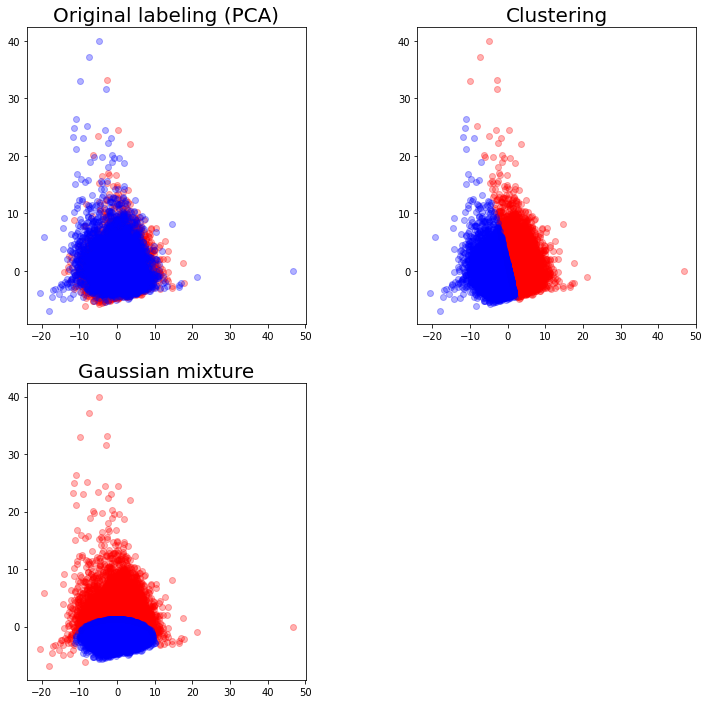

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

ax2.scatter(embedded[hypo_mix,0],embedded[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(embedded[norm_mix,0],embedded[norm_mix,1], c="b",alpha = 0.3)


plt.subplots_adjust(wspace=0.4)

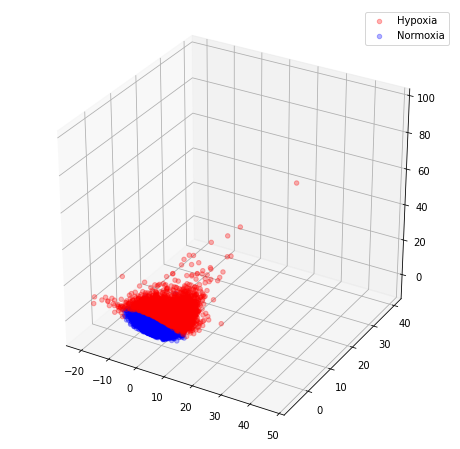

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], data_red[hypo_mix,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_mix,0],data_red[norm_mix,1], data_red[norm_mix,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

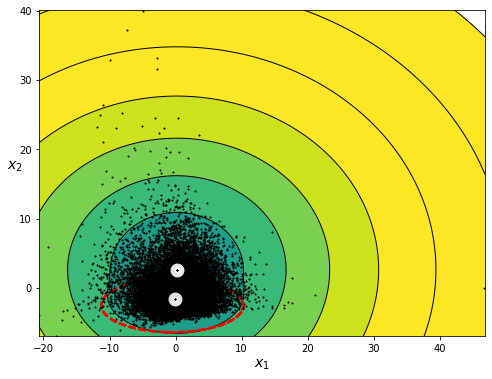

In [ ]:
gm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(gm, data_red[:, 0:2])
plt.show()

What we said previously for K-means clustering seems to hold with Gaussian Mixture as well. Even though these plots do not represent the hole space of the dataset, it is evident that this method will not yield accurate predictions.

#### Bayesian Gaussian Mixture


Here we try to implement a different yet similar method to Gaussian Mixture.

The Bayesian Gaussian Mixture is a method which allows you to not know the exact number of clusters in your data, in a sense it is better because by using a prior it understands how many clusters there should be.

In [ ]:
from sklearn.mixture import BayesianGaussianMixture

In [ ]:
bgm = BayesianGaussianMixture(n_components = 2, random_state = 42)
pred_bgm = bgm.fit_predict(data_red)

In [ ]:
hypo_bgm = (pred_bgm == 1)
norm_bgm = (pred_bgm == 0)

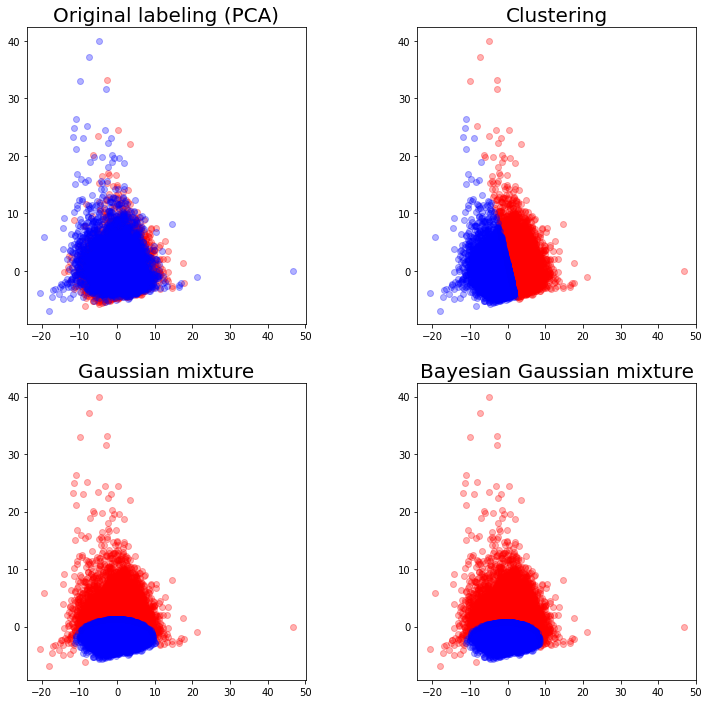

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax3 = fig.add_subplot(2,2,4)

ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

ax2.scatter(embedded[hypo_mix,0],embedded[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(embedded[norm_mix,0],embedded[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(embedded[hypo_bgm,0],embedded[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(embedded[norm_bgm,0],embedded[norm_bgm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

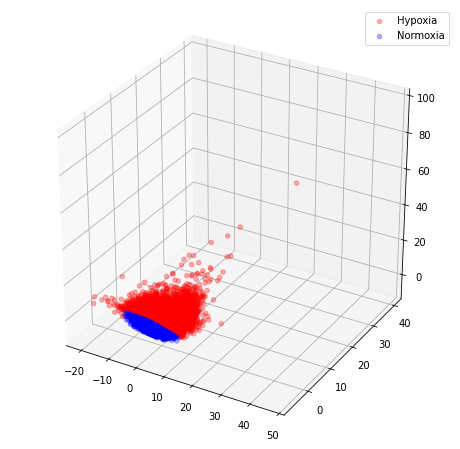

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], data_red[hypo_bgm,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], data_red[norm_bgm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

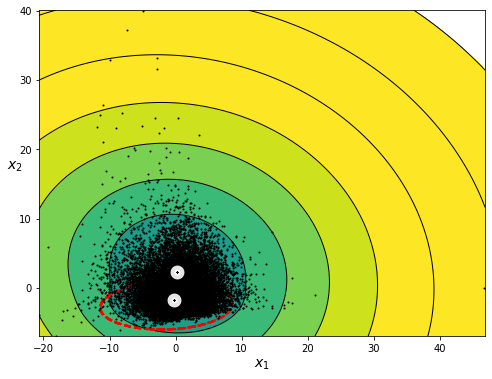

In [ ]:
bgm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(bgm, data_red[:, 0:2])
plt.show()

Bayesian Gaussian Mixture seems to share a lot of similarities with the plots derived from GM. We could expect very close prediction accuracies between the two methods.

#### Agglomerative Clustering

We are also interested on the behavior and performance of hierarchical clustering methods.
In agglomerative algorithms, each item starts in its own cluster, then, objects are recursively clustered by similarity, i.e. the distances between groups, two items at a time. Eventually, all items will be grouped in one cluster.
We choose to implement Agglomerative Clustering, as it is the most commonly used technique of this kind.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
aggl = AgglomerativeClustering(n_clusters=2, linkage='ward')

In [ ]:
pred_aggl = aggl.fit_predict(data_red)

In [ ]:
hypo_aggl = (pred_aggl == 1)
norm_aggl = (pred_aggl == 0)

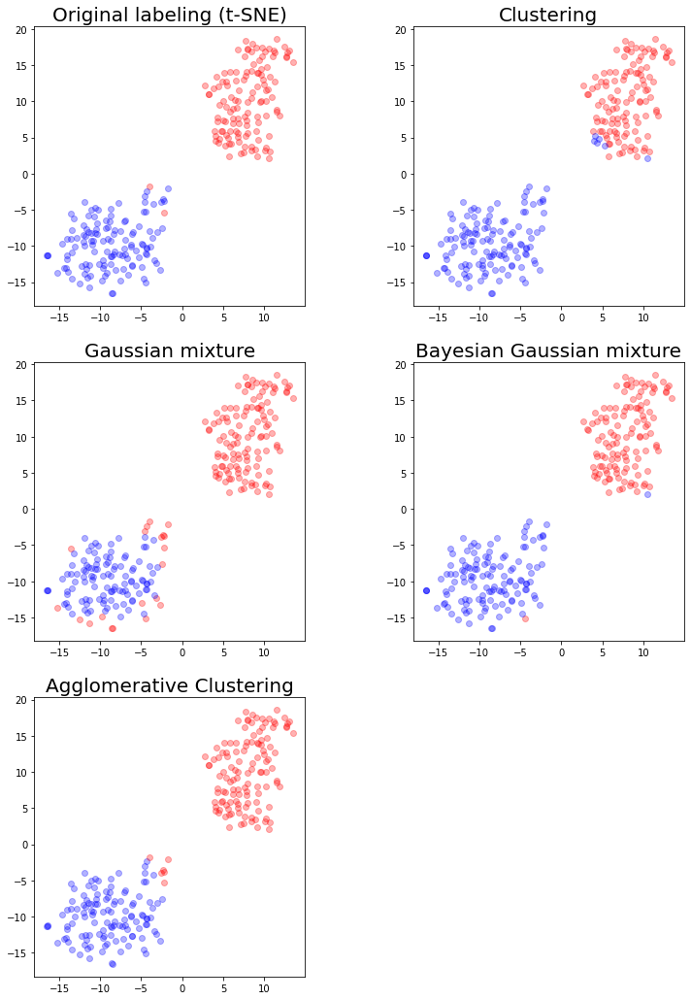

In [ ]:
fig = plt.figure(figsize = (12,18))
ax = fig.add_subplot(3,2,1)
ax1 = fig.add_subplot(3,2,2)
ax2 = fig.add_subplot(3,2,3)
ax3 = fig.add_subplot(3,2,4)
ax4 = fig.add_subplot(3,2,5)

ax.set_title('Original labeling (t-SNE)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax4.set_title('Agglomerative Clustering', fontsize = 20)

ax.scatter(embedded[l_hypoxia,0],embedded[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(embedded[l_normoxia,0],embedded[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(embedded[hypo,0],embedded[hypo,1], c="r",alpha = 0.3)
ax1.scatter(embedded[norm,0],embedded[norm,1], c="b",alpha = 0.3)

ax2.scatter(embedded[hypo_mix,0],embedded[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(embedded[norm_mix,0],embedded[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(embedded[hypo_bgm,0],embedded[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(embedded[norm_bgm,0],embedded[norm_bgm,1], c="b",alpha = 0.3)

ax4.scatter(embedded[hypo_aggl,0],embedded[hypo_aggl,1], c="b",alpha = 0.3)
ax4.scatter(embedded[norm_aggl,0],embedded[norm_aggl,1], c="r",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

This clustering method can be easily visualized in 2D plots known as dendograms, in which the clusters at each step of the algorithm can be clearly displayed. With the following cell, we will try to implement dendograms for each linkage method available for AgglomerativeClustering.

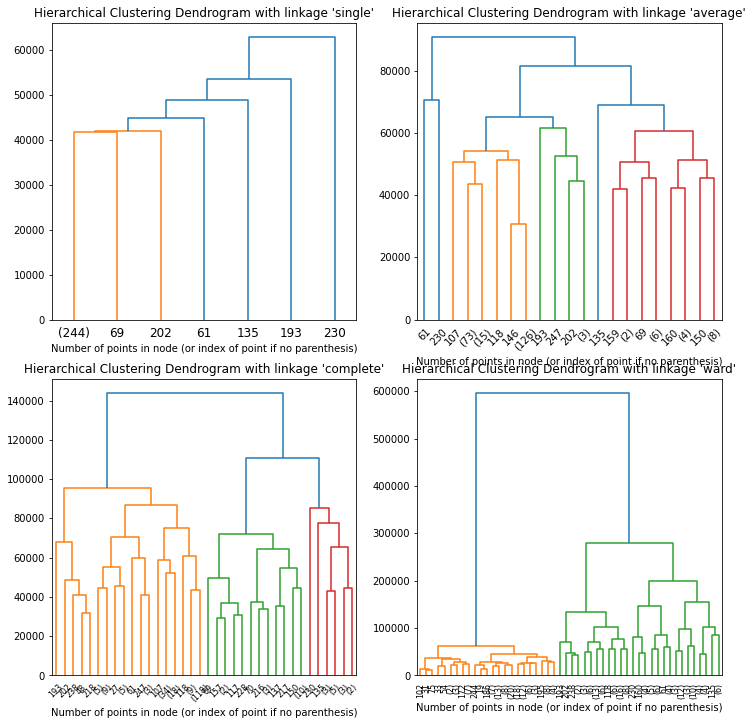

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
l_linkage = ['single', 'average', 'complete', 'ward']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12,12))

for n, linkage in enumerate(l_linkage):
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage=linkage)
    model = model.fit(data.T)

    ax = plt.subplot(2, 2, n + 1)
    # plot the top five levels of the dendrogram
    plot_dendrogram(model, truncate_mode="level", p=5)
    ax.set_title("Hierarchical Clustering Dendrogram with linkage " + "'" + linkage + "'")
    ax.set_xlabel("Number of points in node (or index of point if no parenthesis)")

plt.show()

The assumption we make is the same as the ones we made above, that is hierarchical clustering methods are not the most suitable for this type of datasets.

#### Evaluating Clustering methods

We will now look at how the various clusterings perform in understanding whether a cell is an Hypoxia one or not.

We will do it over the normal data, i.e. 'df' transposed, that is data.T

In [ ]:
y = []
for i in range(len(l_hypoxia) + len(l_normoxia)):
  if i in l_hypoxia:
    y.append(1)
  elif i in l_normoxia:
    y.append(0)

##### K Means Clustering

In [ ]:
y_pred_clus = kmeans.fit_predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_clus==y))
print("fraction of correct predictions", np.sum(y_pred_clus==y) / len(y_pred_clus))

correct predictions:  8626
fraction of correct predictions 0.5875221359487808


##### Gaussian Mixture

In [ ]:
gm.fit(data.T)
y_pred_mix = gm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_mix==y))
print("fraction of correct predictions", np.sum(y_pred_mix==y) / len(y_pred_mix))

correct predictions:  6305
fraction of correct predictions 0.429437406347909


##### Bayesian Gaussian Mixture

In [ ]:
bgm.fit(data.T)
y_pred_bgm = bgm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_bgm==y))
print("fraction of correct predictions", np.sum(y_pred_bgm==y) / len(y_pred_bgm))

correct predictions:  5853
fraction of correct predictions 0.3986514098896608


By observing these results, we can conclude that, once more, all clustering methods implemented above perform rather poorly on this larger dataset. More specifically, GM and BGM indeed have a comparable degree of accuracy (both seriously insufficient), while, K-Means gets the highest prediction accuracy among the three methods.

###Classifiers

#### Preprocessing: PCA reduction for hyperparameters tuning

As before, we will perform a PCA reduction in order to get a lower dimensional dataset on which to run Grid Search (as it is very time-consuming) and we'll obtain the best-performing hperparameters of the model on the reduced dataset. After that, we will run the model on the original dataset, with the same hyperparameters.
In this section we will also use the function train_test_split() to create a training and a test set on which to fit and predict all the classifiers for this section (i.e., DropSeq HCC).

In [ ]:
from sklearn.decomposition import PCA

#HCC_drop_T stands for HCC DropSeq transposed
HCC_drop_T = df.T
X = HCC_drop_T.to_numpy()
pca = PCA(n_components=100)
X_red = pca.fit_transform(X)

In [ ]:
X_red.shape

(14682, 100)

In [ ]:
sum(pca.explained_variance_ratio_)

0.686441536998241

In [ ]:
condition = []
for i in list(HCC_drop_T.index):
  if "Normoxia" in i:
    condition.append(0)
  if "Hypoxia" in i:
    condition.append(1)
HCC_drop_T["Condition"] = condition

y = np.array(condition)

X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(X_red, y, test_size=0.33, random_state = 42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = 42)

In [ ]:
(X_train_red.shape, X_test_red.shape, X_train.shape, X_test.shape)

((9836, 100), (4846, 100), (9836, 3000), (4846, 3000))

#### Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(criterion = "gini", random_state=42)

p_grid = {'n_estimators': [200, 400]}

gs = GridSearchCV(rfc, param_grid = p_grid).fit(X_train_red, y_train_red)
gs.best_params_

{'n_estimators': 200}

In [ ]:
rfc = RandomForestClassifier(n_estimators = gs.best_params_["n_estimators"],
                             min_samples_leaf = 1,
                             min_samples_split = 2,
                             criterion="gini", random_state = 42)

rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)
accuracy_score(y_pred, y_test)

0.9314898885678911

##### Analysing relationship between Principal Components and accuracy

In [ ]:
df_train_HCC = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt", sep=" ")

In [ ]:
namesH = df_train_HCC.columns.values
df_train_HCC_t = df_train_HCC.T
df_train_HCC_t["Classification"] = [i for i in range(len(namesH))]


for i in range(len(namesH)):
    if "Hypo" in namesH[i]:
        df_train_HCC_t["Classification"][i] = 1
    else:
        df_train_HCC_t["Classification"][i] = 0

l = list(df_train_HCC_t["Classification"])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score

acc_list = []
dim_list = [i for i in range(1, 20)]
for i in range(1, 20):

  #PCA
  X = df_train_HCC.to_numpy()
  X_t = np.transpose(X)
  pca = PCA(n_components = i)
  Xred = pca.fit_transform(X_t)
  df_red = pd.DataFrame(Xred)

  #Creating the classification framework
  df_red["Classification"] = l


  X = df_red.iloc[:,:-1]
  y = df_red["Classification"]


  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = 42)

  #Fitting the random forest
  rfc = RandomForestClassifier(n_estimators = 400,
                               min_samples_leaf = 1,
                               min_samples_split = 2,
                               criterion="gini", random_state = 42)

  rfc.fit(X_train, y_train)
  y_pred = rfc.predict(X_test)
  acc_list.append(accuracy_score(y_pred, y_test))

<BarContainer object of 19 artists>

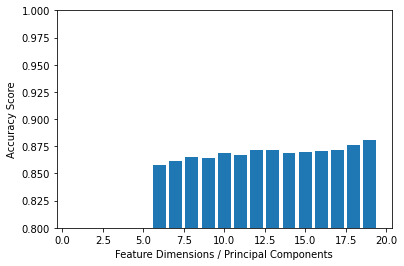

In [ ]:
#plotting the accuracy scores

plt.xlabel("Feature Dimensions / Principal Components")
plt.ylabel("Accuracy Score")
plt.ylim([0.80, 1])

plt.bar(dim_list, acc_list)

#### Gradient Boosting

In [ ]:
(X_train_red.shape, X_test_red.shape, X_train.shape, X_test.shape)

((9836, 100), (4846, 100), (9836, 3000), (4846, 3000))

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(random_state = 42)

p_grid = {'max_features' : [10, 25],
          'max_leaf_nodes' : [16],
          'n_estimators' : [150, 400]}

gs = GridSearchCV(gb_clf, param_grid = p_grid).fit(X_train_red, y_train_red)
gs.best_params_

{'max_features': 25, 'max_leaf_nodes': 16, 'n_estimators': 400}

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(learning_rate = 0.1,
                                    max_features = gs.best_params_['max_features'],
                                    max_leaf_nodes = gs.best_params_['max_leaf_nodes'],
                                    n_estimators = gs.best_params_['n_estimators'])

gb_clf.fit(X_train, y_train)
y_pred = gb_clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.9570780024762691

#### SVM

In [ ]:
(X_train_red.shape, X_test_red.shape, X_train.shape, X_test.shape)

((14489, 34), (7137, 34), (14489, 3000), (7137, 3000))

In [ ]:
from sklearn.svm import SVC

svc = SVC()
parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}

clf = GridSearchCV(svc, parameters).fit(X_train_red, y_train_red)
print(clf.best_params_)
clf.best_params

In [ ]:
svc = SVC(C=clf.best_params_["C"],
          kernel=clf.best_params_["kernel"])

svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
accuracy_score(y_pred, y_test)

0.9812246041754239

#### Neural Network

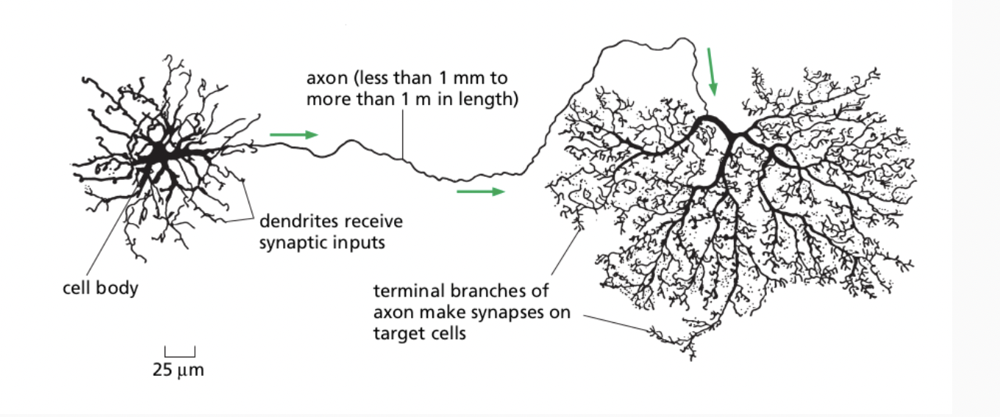How does a Neural Network works actually?



The Neural Network is built upon the simplest model we have of the neuron: the perceptron.

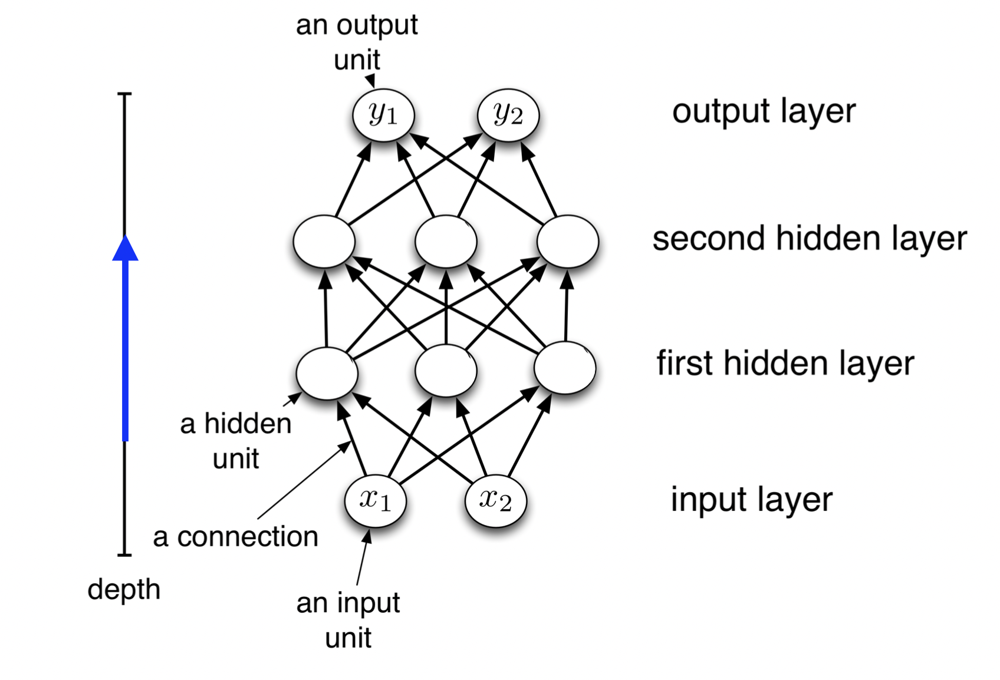

Each neuron presents its personal activation function that determines the output, but in practice you use in all the neurons from the same layer the same activation function. The most common and used one is the ReLu

We have basically four steps we have to perform 4 steps.

1. Obtain your training data $({{x_i,y_i}})$
2. Choose your decision function and your loss function   $  \mathcal{L}(\hat{y}, y_i)$ \\
3. Define your goal $y^\ast = arg\min \sum_{i} \mathcal{L}(f_\theta(x_i), y_i) $
4. Train with SGD taking small steps in the direction of opposite gradient $\theta^{t+1} = \theta^t -\eta*\nabla(\mathcal{L}(\hat{y}, y_i)$

In [ ]:
df_train_HCC = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_Filtered_Normalised_3000_Data_train.txt", sep=" ")

In [ ]:
namesH = df_train_HCC.columns.values

In [ ]:
df_train_HCC_t = df_train_HCC.T
df_train_HCC_t["Classification"] = [i for i in range(len(namesH))]

for i in range(len(namesH)):
    if "Hypo" in namesH[i]:
        df_train_HCC_t["Classification"][i] = 1
    else:
        df_train_HCC_t["Classification"][i] = 0

In [ ]:
from sklearn.model_selection import train_test_split

X = df_train_HCC_t.iloc[:,:-1]
y = df_train_HCC_t["Classification"]


X_train, X_test, Y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 22)

In [ ]:
x_valid, x_train = X_train[:1700], X_train[1700:]
y_valid, y_train = Y_train[:1700], Y_train[1700:]

In [ ]:
model = Sequential()

In [ ]:

model.add(Dense(units=64, input_shape= (3000,)))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 1))

In [ ]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=keras.optimizers.SGD(learning_rate=0.00001, momentum = 0.2),
              metrics=['accuracy'])

In [ ]:
hist=model.fit(x = x_train, y = y_train, epochs=10, validation_data = (x_valid,y_valid))

Epoch 1/10
269/269 [==============================] - 3s 10ms/step - loss: 0.0038 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch 2/10
269/269 [==============================] - 2s 9ms/step - loss: 0.0038 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch 3/10
269/269 [==============================] - 2s 8ms/step - loss: 0.0038 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch 4/10
269/269 [==============================] - 2s 8ms/step - loss: 0.0038 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch 5/10
269/269 [==============================] - 2s 8ms/step - loss: 0.0038 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch 6/10
269/269 [==============================] - 2s 9ms/step - loss: 0.0038 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch 7/10
269/269 [==============================] - 2s 9ms/step - loss: 0.0037 - accuracy: 0.9998 - val_loss: 0.1715 - val_accuracy: 0.9594
Epoch

In [ ]:
model.evaluate(X_test, y_test)

138/138 [==============================] - 1s 9ms/step - loss: 0.1640 - accuracy: 0.9580


[0.16395537555217743, 0.9580022692680359]

We obtained a 95,8% accuracy for HCC1806 in DropSeq

#### Let's tune the parameters for our neural network on HCC1806

In [ ]:
import tensorflow as tf
import keras
from keras import layers
from keras import models
from keras import utils
from keras.layers import Dense
from keras.models import Sequential
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Activation
from keras.regularizers import l2


from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras import losses
from sklearn.utils import shuffle



print(tf.keras.__version__)

2.8.0


Import the dataset

In [ ]:
df_train_HCC = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/HCC1806_Filtered_Normalised_3000_Data_train.txt", sep=" ")

In [ ]:
namesH = df_train_HCC.columns.values

In [ ]:
df_train_HCC_t = df_train_HCC.T
df_train_HCC_t["Classification"] = [i for i in range(len(namesH))]

for i in range(len(namesH)):
    if "Hypo" in namesH[i]:
        df_train_HCC_t["Classification"][i] = 1
    else:
        df_train_HCC_t["Classification"][i] = 0

In [ ]:
from sklearn.model_selection import train_test_split

X = df_train_HCC_t.iloc[:,:-1]
y = df_train_HCC_t["Classification"]


X_train, X_test, Y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [ ]:
x_valid, x_train = X_train[:1000], X_train[1000:]
y_valid, y_train = Y_train[:1000], Y_train[1000:]

In [ ]:
model = Sequential()
model.add(Dense(units=512, activation= "relu", input_shape= (3000,)))
model.add(Dense(units= 256, activation= "relu"))
model.add(Dense(units= 128, activation= "relu"))
model.add(Dense(1, kernel_initializer='normal', activation='sigmoid'))
	# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


In [ ]:

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
import numpy

# Function to create model, required for KerasClassifier
def create_model():
	# create model
  model = Sequential()
  model.add(Dense(units=512, activation= "relu", input_shape= (3000,)))
  model.add(Dense(units= 256, activation= "relu"))
  model.add(Dense(units= 256, activation= "relu"))
  model.add(Dense(units= 256, activation= "relu"))
  model.add(Dense(units= 256, activation= "relu"))
  model.add(Dense(units= 128, activation= "relu"))
  model.add(Dense(units= 128, activation= "relu"))
  model.add(Dense(1))
	# Compile model
  model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
  return model

# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
# load pima indians dataset

model = KerasClassifier(build_fn=create_model, epochs=8, batch_size=1000, verbose=1)
# evaluate using 10-fold cross validation
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
results = cross_val_predict(model, X, y, cv=kfold)
print(results.mean())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.


Epoch 1/8
14/14 [==============================] - 3s 165ms/step - loss: 1.7769 - accuracy: 0.5780
Epoch 2/8
14/14 [==============================] - 2s 165ms/step - loss: 0.4211 - accuracy: 0.8239
Epoch 3/8
14/14 [==============================] - 2s 164ms/step - loss: 0.2004 - accuracy: 0.9491
Epoch 4/8
14/14 [==============================] - 2s 164ms/step - loss: 0.1021 - accuracy: 0.9761
Epoch 5/8
14/14 [==============================] - 2s 164ms/step - loss: 0.0818 - accuracy: 0.9818
Epoch 6/8
14/14 [==============================] - 2s 165ms/step - loss: 0.0538 - accuracy: 0.9903
Epoch 7/8
14/14 [==============================] - 2s 167ms/step - loss: 0.0384 - accuracy: 0.9957
Epoch 8/8
14/14 [==============================] - 2s 167ms/step - loss: 0.0338 - accuracy: 0.9976
Epoch 1/8
14/14 [==============================] - 3s 163ms/step - loss: 1.6117 - accuracy: 0.5464
Epoch 2/8
14/14 [==============================] - 2s 167ms/step - loss: 0.3596 - accuracy: 0.8659
Epoch 3/8


We perform a similar model as before, but now here we check how it generalizes with Stratified K-fold. The results are pretty satisfying

In [ ]:
model.fit(X_train, Y_train, epochs = 10)

Epoch 1/10
11/11 [==============================] - 3s 167ms/step - loss: 1.5109 - accuracy: 0.5836
Epoch 2/10
11/11 [==============================] - 2s 173ms/step - loss: 0.4243 - accuracy: 0.8263
Epoch 3/10
11/11 [==============================] - 2s 170ms/step - loss: 0.1637 - accuracy: 0.9538
Epoch 4/10
11/11 [==============================] - 2s 165ms/step - loss: 0.1220 - accuracy: 0.9760
Epoch 5/10
11/11 [==============================] - 2s 163ms/step - loss: 0.0670 - accuracy: 0.9911
Epoch 6/10
11/11 [==============================] - 2s 166ms/step - loss: 0.0492 - accuracy: 0.9954
Epoch 7/10
11/11 [==============================] - 2s 169ms/step - loss: 0.0400 - accuracy: 0.9971
Epoch 8/10
11/11 [==============================] - 2s 173ms/step - loss: 0.0357 - accuracy: 0.9976
Epoch 9/10
11/11 [==============================] - 2s 166ms/step - loss: 0.0349 - accuracy: 0.9977
Epoch 10/10
11/11 [==============================] - 2s 164ms/step - loss: 0.0345 - accuracy: 0.9978

In [ ]:
lol = model.predict(X_test)

In [ ]:
sklearn.metrics.accuracy_score(y_test, lol)

0.9539160045402951

Also here we obtained an approximate accuracy of 95%

We try now also a different approach: we define a customize learning rate for our optimizer

In [ ]:
epochs = 30
learning_rate = 0.1 # initial learning rate
decay_rate = 0.1
momentum = 0.8

In [ ]:
model = Sequential()

In [ ]:

model.add(Dense(units=64, input_shape= (3000,)))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 256, activation= 'relu'))
model.add(Dense(units= 1))

In [ ]:
sgd = tf.keras.optimizers.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [ ]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer= sgd,
              metrics=['accuracy'])

In [ ]:
# define the learning rate change
def exp_decay(epoch):
    lrate = learning_rate * np.exp(-decay_rate*epoch)
    return lrate

In [ ]:
loss_history = tf.keras.callbacks.History()
lr_rate = tf.keras.callbacks.LearningRateScheduler(exp_decay)
callbacks_list = [loss_history, lr_rate]

In [ ]:
hist=model.fit(x = x_train, y = y_train, epochs= epochs,callbacks = callbacks_list, batch_size = 1000,
               verbose = 1, validation_data = (x_valid,y_valid))

Epoch 1/30
10/10 [==============================] - 1s 80ms/step - loss: 0.1267 - accuracy: 0.9487 - val_loss: 0.1289 - val_accuracy: 0.9520 - lr: 0.1000
Epoch 2/30
10/10 [==============================] - 1s 74ms/step - loss: 0.1252 - accuracy: 0.9485 - val_loss: 0.1270 - val_accuracy: 0.9510 - lr: 0.0905
Epoch 3/30
10/10 [==============================] - 1s 74ms/step - loss: 0.1239 - accuracy: 0.9508 - val_loss: 0.1280 - val_accuracy: 0.9540 - lr: 0.0819
Epoch 4/30
10/10 [==============================] - 1s 73ms/step - loss: 0.1225 - accuracy: 0.9519 - val_loss: 0.1235 - val_accuracy: 0.9540 - lr: 0.0741
Epoch 5/30
10/10 [==============================] - 1s 75ms/step - loss: 0.1208 - accuracy: 0.9502 - val_loss: 0.1254 - val_accuracy: 0.9520 - lr: 0.0670
Epoch 6/30
10/10 [==============================] - 1s 73ms/step - loss: 0.1198 - accuracy: 0.9512 - val_loss: 0.1254 - val_accuracy: 0.9510 - lr: 0.0607
Epoch 7/30
10/10 [==============================] - 1s 73ms/step - loss: 0.1

In [ ]:
model.evaluate(X_test, y_test)

138/138 [==============================] - 1s 4ms/step - loss: 0.1325 - accuracy: 0.9421


[0.13247399032115936, 0.9421112537384033]

Beside this was done for improving our performance, we actually got a little less of accuracy

Instead, we know try to optimize a discrete number of parameters with GridSearch

In [ ]:
import numpy
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

In [ ]:
def create_model_2(optimizer, init='glorot_uniform'):
     # define model
  model = Sequential()
  model.add(Dense(units=64, input_shape= (3000,)))
  model.add(Dense(units= 256,kernel_initializer=init, activation= 'relu'))
  model.add(Dense(units= 256, kernel_initializer=init, activation= 'relu'))
  model.add(Dense(units= 256,kernel_initializer=init, activation= 'relu'))
  model.add(Dense(units= 256, kernel_initializer=init,activation= 'relu'))
  model.add(Dense(units= 256, kernel_initializer=init,activation= 'relu'))
  model.add(Dense(units= 1))
    # compile model
  model.compile(loss =tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer= optimizer,
              metrics=['accuracy'])
  return model

In [ ]:
%%time
# fix random seed for reproducibility (this might work or might not work
# depending on each library's implenentation)
seed = 7
numpy.random.seed(seed)

# create the sklearn model for the network
model_init_batch_epoch_CV = KerasClassifier(build_fn=create_model_2, verbose=1)

# we choose the initializers that came at the top in our previous cross-validation!!
epochs = [10,20]
batches = [1000,1100,1200,1300,1400]
optimizer = ["SGD", 'AdaGrad', 'Adam']

# grid search for initializer, batch size and number of epochs
param_grid = dict(epochs = epochs, optimizer=optimizer, batch_size=batches)
grid = GridSearchCV(estimator=model_init_batch_epoch_CV,
                    param_grid=param_grid,
                    cv=3)
grid_result = grid.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  import sys


Epoch 1/10
7/7 [==============================] - 1s 67ms/step - loss: 0.6924 - accuracy: 0.3887
Epoch 2/10
7/7 [==============================] - 0s 67ms/step - loss: 0.6884 - accuracy: 0.3887
Epoch 3/10
7/7 [==============================] - 0s 66ms/step - loss: 0.6847 - accuracy: 0.3887
Epoch 4/10
7/7 [==============================] - 0s 70ms/step - loss: 0.6814 - accuracy: 0.3887
Epoch 5/10
7/7 [==============================] - 0s 69ms/step - loss: 0.6784 - accuracy: 0.3887
Epoch 6/10
7/7 [==============================] - 0s 68ms/step - loss: 0.6757 - accuracy: 0.3887
Epoch 7/10
7/7 [==============================] - 0s 71ms/step - loss: 0.6731 - accuracy: 0.3887
Epoch 8/10
7/7 [==============================] - 1s 72ms/step - loss: 0.6706 - accuracy: 0.3886
Epoch 9/10
7/7 [==============================] - 0s 67ms/step - loss: 0.6684 - accuracy: 0.3886
Epoch 10/10
4/4 [==============================] - 0s 21ms/step - loss: 0.6688 - accuracy: 0.4045
Epoch 1/10
7/7 [=============

In [ ]:
grid.best_params_

{'batch_size': 1300, 'epochs': 10, 'optimizer': 'Adam'}

We see that our best paramters are 1300 batches, 10 epochs and using an Adam optimizer

In [ ]:
'''# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')
    '''''

In [ ]:
model = Sequential()
model.add(Dense(units=64, input_shape= (3000,)))
model.add(Dense(units= 256,kernel_initializer='glorot_uniform', activation= 'relu'))
model.add(Dense(units= 256, kernel_initializer='glorot_uniform',activation= 'relu'))
model.add(Dense(units= 1))
    # compile model
model.compile(loss =tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer= 'Adam',
              metrics=['accuracy'])

In [ ]:

hist=model.fit(x = X_train, y = Y_train, epochs= 10,batch_size=1300,
                validation_data = (X_test,y_test))

Epoch 1/10
8/8 [==============================] - 4s 236ms/step - loss: 0.5481 - accuracy: 0.7293 - val_loss: 0.3250 - val_accuracy: 0.9017
Epoch 2/10
8/8 [==============================] - 1s 158ms/step - loss: 0.2012 - accuracy: 0.9236 - val_loss: 0.1472 - val_accuracy: 0.9353
Epoch 3/10
8/8 [==============================] - 1s 162ms/step - loss: 0.1036 - accuracy: 0.9598 - val_loss: 0.1272 - val_accuracy: 0.9562
Epoch 4/10
8/8 [==============================] - 1s 166ms/step - loss: 0.0625 - accuracy: 0.9784 - val_loss: 0.1255 - val_accuracy: 0.9535
Epoch 5/10
8/8 [==============================] - 1s 163ms/step - loss: 0.0419 - accuracy: 0.9844 - val_loss: 0.1322 - val_accuracy: 0.9557
Epoch 6/10
8/8 [==============================] - 1s 158ms/step - loss: 0.0280 - accuracy: 0.9925 - val_loss: 0.1436 - val_accuracy: 0.9532
Epoch 7/10
8/8 [==============================] - 1s 140ms/step - loss: 0.0190 - accuracy: 0.9952 - val_loss: 0.1593 - val_accuracy: 0.9519
Epoch 8/10
8/8 [====

In [ ]:
model.evaluate(X_test, y_test)

138/138 [==============================] - 0s 3ms/step - loss: 0.2226 - accuracy: 0.9494


[0.22260290384292603, 0.9493756890296936]

We obtain a good accuracy also here, but always a little bit worse than our original NN

To conclude the project, we would like to summarise the results. By various supervised training models we were able to predict hypoxic/normoxic condition of the cell with following accuracies. SmartSeq MCF7: 100%, SmartSeq HCC1806: 95,55%, DropSeq MCF7: 96,61%, DropSeq HCC1806: 95.37%. The datasets corresponding to Smart sequencing were easier to analyse, in fact, we were able to reach 100% precision on the MCF7 cell line dataset. Surprisingly, this result was achieved just by training the model with Random Forest method. The performance for HCC1806 was a bit lower. By doing cross validation on the HCC1806 DropSeq the performance differed from 92% to 100% due to lower number of samples in comparison to DropSeq. Since the variance of the testing error was higher with SmartSeq we got a little different result, than we expected.
DropSeq was harder to analyse. First reason is the restriction in computing power  since it would take a lot of time to find the right hyperparameters for the models. Even by trying to reduce the dimensionality with PCA we weren’t able to reduce the time significantly. In the end, we chose to proceed with a hard voting classifier composed of RandomForest, Gradient Boosted Trees, AdaBoost and SVM. We were able to reach relatively high results with it, and in the end we chose it for making the predictions on the test set. We also implemented the Neural Network classifier, which didn’t show a significant advantage compared to the methods listed above. By looking at the for the “feature_importance” in the RandomForest method we were able to find some genes that multiple papers mark as correlating with hypoxia.